# **Statistical Analysis on the Role of Biochemical and Lifestyle Factors in Chronic Kidney Disease Diagnosis and Progression**

### 1.0 Introduction

Kidneys play an important role in your body by filtering all the wastes, toxins, and excess fluids from your blood every 30 mins—most of which is expelled as urine. Moreover, they help in controlling blood pressure, signaling the body when to make red blood cells, keeping your bones healthy, and regulating essential blood chemicals. Chronic kidney disease (CKD) is a progressive condition that occurs when these kidneys are damaged and can't filter blood as well as they should, leading to excessive waste build-up in the body. It can progress as far as kidney failure and early cardiovascular disease. This disease affects more than $10\%$ of the general population and leads to various difficulties with your health. Having CKD can even be an indicator of other underlying pre-existing conditions like diabetes and high blood pressure.

#### 1.1 Motivation

Many people do not realize that they have CKD until it is too late because the symptoms often do not present until a more advanced state. Some people may even have difficulty recognizing the severity of their condition. Thus, in order to identify and categorize CKD in people early on, it would be helpful to understand the underlying clusters within patient populations based on biochemical markers, lifestyle habits, and clinical parameters. By exploring these natural groups in a population, stakeholders in this study—primarily those involved in the healthcare industry in some manner like researchers and nephrologists—can identify patient subtypes who may share similar disease pathways and risk profiles. Researchers can then inform the general public about the kind of lifestyle choices or biomarkers that may put them at risk of having CKD, leading to early prevention. Nephrologists can also categorize CKD symptoms in patients, which will help with determining an appropriate treatment. Even public health policy officials could benefit from being able to determine at-risk demographics and taking preventative measures to reduce the number of people that get CKD.

#### 1.2 Research Goals

1.   Identify larger "main clusters" of CKD and non-CKD patients. In general, we would like for most of our patients to be clustered in with a larger cluster, rather than be separated as small or singleton clusters.
2.   Identify potential sub-clusters of patients within each of the "main clusters."
3.   What are the most dissimilar clusters of patients in this dataset? What makes them so dissimilar?
4.   What attributes characterize each of these clusters and sub-clusters?

#### 1.3 Desired Clustering

Because of our motivation and our research goals, a clustering where each cluster is well-separated and we could form a dendrogram with a nested cluster relationship would be best. We want to be able to clearly identify the relationship between the features and the stages of CKD (from $0$ to $5$). A clustering result with singleton clusters or a fuzzy clustering in which some points are ambiguous would make it more difficult to identify these relationships.

### 2.0 Dataset Discussion

#### 2.1 Imports

In [92]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

from sklearn.metrics import adjusted_rand_score
from gower import gower_matrix
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score

from sklearn import preprocessing

pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore')

#### 2.2 Dataset

In [12]:
df = pd.read_csv('updated_ckd_dataset_with_stages.csv')
df.head()

,serum_creatinine,gfr,bun,serum_calcium,ana,c3_c4,hematuria,oxalate_levels,urine_ph,blood_pressure,...,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,cluster,ckd_pred,ckd_stage
0,0.683683,32.946784,7.553739,10.039896,0,138.204989,0,2.878164,7.864308,115.224217,...,yes,daily,no,yes,stable,low,10,5,CKD,3
1,3.809044,32.685035,141.347494,8.330543,1,24.282343,1,4.767639,4.920015,130.143900,...,yes,daily,no,yes,loss,moderate,1,2,CKD,3
2,1.143827,2.079805,15.979104,9.419229,0,163.970666,0,1.818613,6.188115,98.026072,...,no,daily,no,no,stable,moderate,4,6,CKD,5
3,4.804657,109.871407,53.307333,7.556631,1,71.056846,1,4.051686,5.278607,142.166650,...,no,never,yes,yes,stable,high,9,2,CKD,1
4,4.920235,42.214590,134.182157,7.289379,1,23.384639,1,3.240920,4.862923,151.962572,...,no,occasionally,yes,no,gain,high,7,2,CKD,3


In [ ]:
df.shape

(4000, 23)

In [ ]:
df.dtypes

,0
serum_creatinine,float64
gfr,float64
bun,float64
serum_calcium,float64
ana,int64
c3_c4,float64
hematuria,int64
oxalate_levels,float64
urine_ph,float64
blood_pressure,float64


#### 2.3 Dataset Source

This dataset was taken and downloaded as a csv file from [Kaggle](https://www.kaggle.com/datasets/aryannandanwar/ckdchronic-kidney-disease-dataset-with-stages) on April 7th, 2025. It was made by Aryan Nandanwar and most recently updated January 2025.

#### 2.4 Dataset Description

The Chronic Kidney Disease (CKD) dataset used in this study contains $4,000$ observations, with each observation representing a unique patient record. These records reflect a broad spectrum of clinical/medical, biochemical, and lifestyle variables relevant to the diagnosis and staging of CKD. In total, it includes $23$ features, categorized into three major types: Biochemical & Clinical Indicators, Medical History & Lifestyle Factors, and Outcomes & CKD Staging. It is not specified in the dataset source how the data was collected.

While the dataset includes a very large and comprehensive variety of features, it is not fully inclusive of all factors that would be relevant to CKD prediction and categorization. For instance, demographic variables like age, gender, ethnicity, or geographic region are not included, which can significantly impact CKD risk and progression. Comorbid conditions such as diabetes and cardiovascular disease are not included either, which are historically associated with CKD patients.

The lack of inclusivity in certain observation types impacts the scope of interpretation and actionability for previously mentioned stakeholders in the study like researchers, nephrologists, and public health policy officials. The missing demographic data makes it difficult for public health policymakers to target interventions to specific at-risk populations. For example, if younger patients or ethnic minorities are underrepresented, policy responses might overlook these vulnerable groups. The opposite could also occur, in which the public health efforts put too much emphasis in a demographic that is not significantly diagnosed or impacted by CKD.

Similarly, missing comorbid conditions makes it easier for nephrologists and other healthcare workers to misdiagnose people with CKD and their stage level when their real source of problems could be coming from some other illness with overlapping symptoms from the few features we *have* covered.

#### 2.5 Dataset Features Overview

Biochemical & Clinical Indicators:

*   `serum_creatinine`: Creatinine levels in the blood (mg/dL).
*   `gfr`: Glomerular Filtration Rate (ml/min), a key kidney function measure.
*   `bun`: Blood Urea Nitrogen (mg/dL).
*   `serum_calcium`: Calcium levels in the blood (mg/dL).
*   `c3_c4`: Complement proteins involved in immune response.
*   `oxalate_levels`: Presence of oxalates that may contribute to kidney stones.
*   `urine_ph`: Acidity/alkalinity of urine.
*   `blood_pressure`: Measured blood pressure (mmHg).

Medical History & Lifestyle Factors:

*   `ana`: Presence of antinuclear antibodies (autoimmune marker).
*   `hematuria`: Blood in urine (binary: 0 or 1).
*   `physical_activity`: Level of physical activity.
*   `diet`: Type of diet followed.
*   `water_intake`: Daily water consumption (liters).
*   `smoking`: Smoking habit (yes/no).
*   `alcohol`: Alcohol consumption frequency (never, daily, etc.).
*   `painkiller_usage`: Regular painkiller intake (yes/no).
*   `family_history`: Family history of CKD (yes/no).
*   `weight_changes`: Changes in body weight (stable, gain, loss).
*   `stress_level`: Stress level (low, moderate, high).

Outcome & CKD Staging:

*   `cluster`: Grouping label (possible clustering analysis). **[Note: We will not be using this variable for this study.]**
*   `ckd_pred`: Predicted CKD diagnosis (CKD or Non-CKD).
*   `ckd_stage`: CKD severity stage (1 to 5).

### 3.0 Dataset Cleaning & Exploration

#### 3.1 Handling Missing Values

In [ ]:
df.isna().sum()

,0
serum_creatinine,0
gfr,0
bun,0
serum_calcium,0
ana,0
c3_c4,0
hematuria,0
oxalate_levels,0
urine_ph,0
blood_pressure,0


There are no missing values present in the dataset that we need to worry about cleaning.

#### 3.2 Outlier Identification

In [13]:
# create a new dataframe with just numerical variables
X_num = df.select_dtypes(include=['number']).drop(['ana', 'hematuria', 'cluster', 'months', 'ckd_stage'], axis=1)
X_num.head()

,serum_creatinine,gfr,bun,serum_calcium,c3_c4,oxalate_levels,urine_ph,blood_pressure,water_intake
0,0.683683,32.946784,7.553739,10.039896,138.204989,2.878164,7.864308,115.224217,2.314979
1,3.809044,32.685035,141.347494,8.330543,24.282343,4.767639,4.920015,130.143900,2.250649
2,1.143827,2.079805,15.979104,9.419229,163.970666,1.818613,6.188115,98.026072,2.542343
3,4.804657,109.871407,53.307333,7.556631,71.056846,4.051686,5.278607,142.166650,2.640812
4,4.920235,42.214590,134.182157,7.289379,23.384639,3.240920,4.862923,151.962572,3.148921


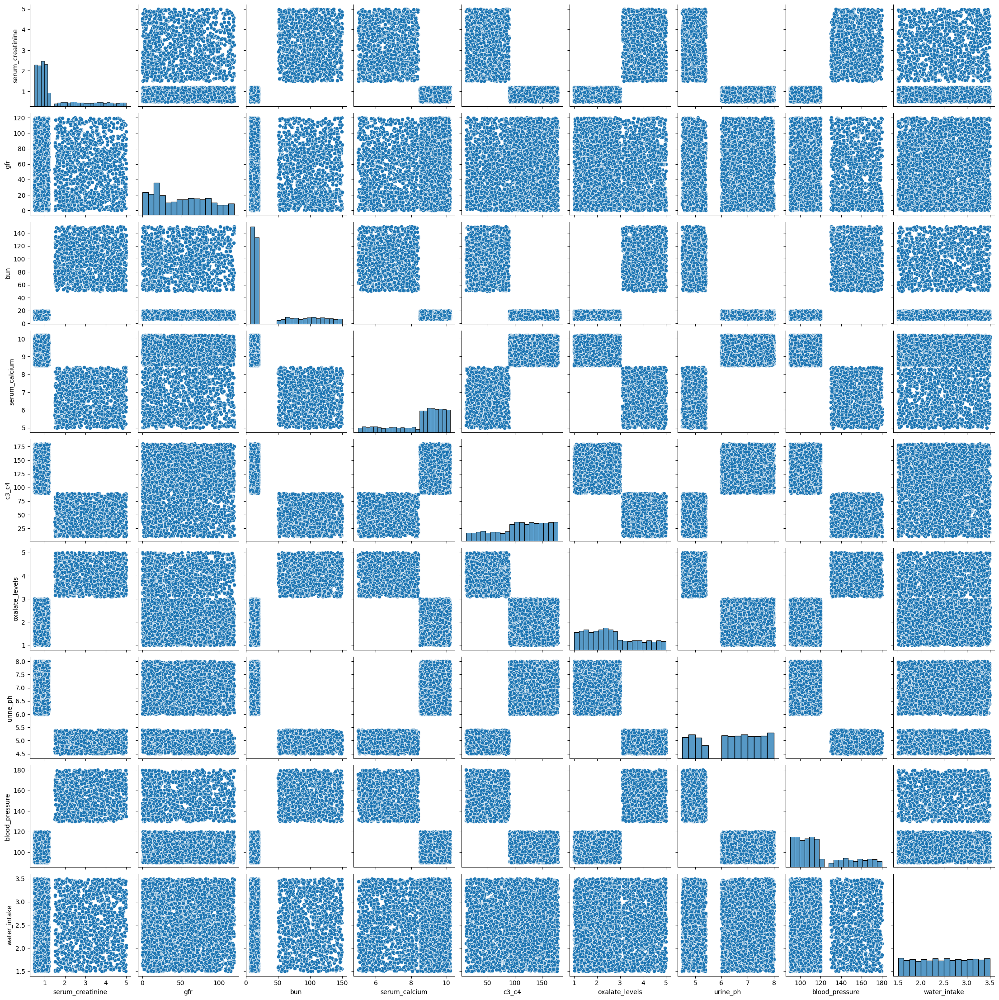

In [4]:
sns.pairplot(X_num)
plt.show()

Just from looking at the pairwise scatterplots between the numerical variables above, there are no notable outliers. In fact, most of the observations seemed to be grouped into two clusters—one noticeable larger than the other—for each scatterplot. There are a few scatterplots in which this division is not so obvious or even all of the points form just one giant cluster like `gfr` vs `water_intake`. Do bear in mind though that while we have no extreme outliers, this dataset is a significant large sample, which may make it harder to see less extreme outliers.

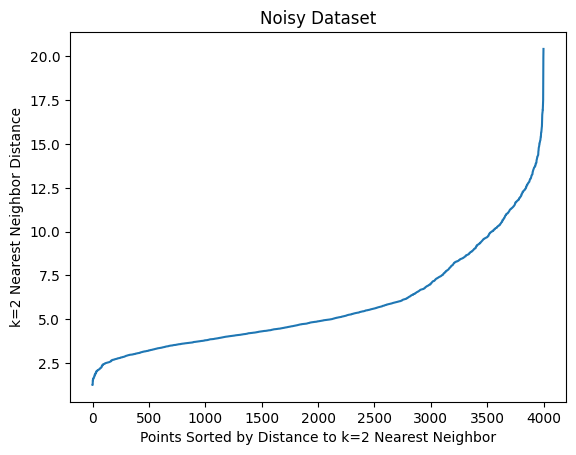

--------------------------------------------


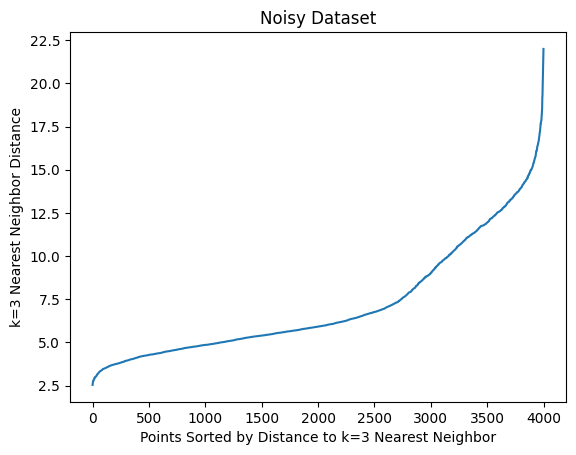

--------------------------------------------


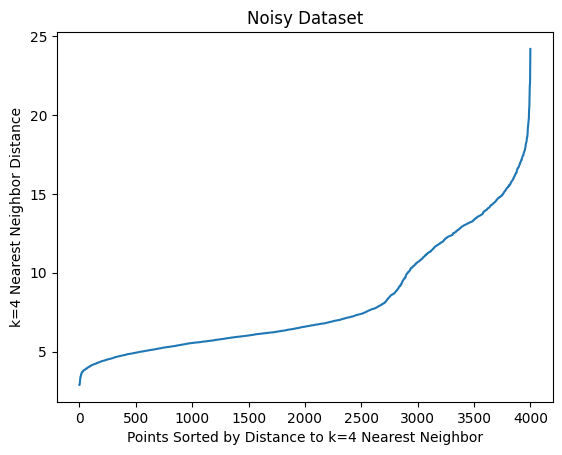

--------------------------------------------


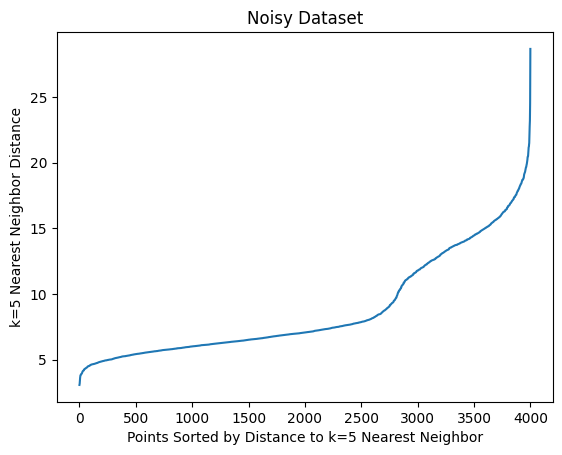

--------------------------------------------


In [5]:
# Find the distance of the kth nearest neighbor
for k in range(2, 6):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(X_num)
    distances, indices = nbrs.kneighbors(X_num)

    plt.plot(np.sort(distances.T[k - 1]))
    # plt.axvline(x=160, color='black')
    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('Noisy Dataset')
    plt.show()
    print('--------------------------------------------')

Taking it a step further and making KNN plots for the numerical variables, we can see that there may be some slight outliers that we were not able to detect in the scatterplots since the slope dramatically increases in the last $50$ or less observations. The KNN plots also suggest that there are two clusters with different densities and a roughly unbalanced number of observations in each cluster.

#### 3.4 Outlier Consideration

Given what we have found so far about potential outliers and our research goals, we don't need to drop those observations since they make up about $12.5\%$ of our dataset, which is a pretty significant portion that may negatively impact or skew our results. Instead, they can be clustered with larger clusters that may happen to be further away since they are not extreme outliers. Bearing this in mind, we would later select our clustering algorithm with the intention of clustering them with the other points. This means we would avoid algorithms like DBSCAN, which is great for identifying an outlier or noise as a "noise point" but it inherently does not cluster these observations with the rest of data.

#### 3.5 Noise Identification & Consideration

Using the same KNN plots as before (see section $3.3$), we can see that there are no notable noise points to consider dropping in the dataset, so we do not need to worry about them. However, in the context of our research motivation, if we *did* find any, we would drop them to avoid having our clustering results be dragged around by noisy observations.

Overall, we do not need to do any further data cleaning steps for this analysis.

### 4.0 Basic Descriptive Analytics

In [14]:
X_num.describe()

,serum_creatinine,gfr,bun,serum_calcium,c3_c4,oxalate_levels,urine_ph,blood_pressure,water_intake
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,1.551423,51.735449,39.346088,8.537530,109.757723,2.624439,6.394566,119.747060,2.505405
std,1.217478,34.389322,42.495106,1.403631,46.556155,1.088755,1.073232,25.218642,0.581993
min,0.500273,0.021317,7.000920,5.002407,10.027574,1.000852,4.500576,90.019471,1.500627
25%,0.758924,20.263808,11.632573,7.810761,76.770105,1.735248,5.248199,100.176525,2.004723
50%,0.995209,50.054933,16.296667,8.982200,115.511599,2.432659,6.580794,111.116236,2.512182
75%,2.065796,80.258482,67.090486,9.583627,148.532716,3.417216,7.305031,138.205563,3.015095
max,4.994009,119.923482,149.999395,10.199344,179.963970,4.999965,7.999886,179.991991,3.499595


In [15]:
X_cat = df[['ana', 'hematuria', 'physical_activity', 'diet', 'smoking', 'alcohol', 'painkiller_usage', 'family_history', 'weight_changes', 'stress_level', 'months', 'ckd_stage']]
X_cat.head()

,ana,hematuria,physical_activity,diet,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage
0,0,0,weekly,high protein,yes,daily,no,yes,stable,low,10,3
1,1,1,weekly,high protein,yes,daily,no,yes,loss,moderate,1,3
2,0,0,weekly,low salt,no,daily,no,no,stable,moderate,4,5
3,1,1,rarely,low salt,no,never,yes,yes,stable,high,9,1
4,1,1,weekly,balanced,no,occasionally,yes,no,gain,high,7,3


In [9]:
for cat in X_cat.columns:
    print(X_cat[cat].value_counts())

ana
0    2800
1    1200
Name: count, dtype: int64
hematuria
0    2800
1    1200
Name: count, dtype: int64
physical_activity
weekly    1401
rarely    1315
daily     1284
Name: count, dtype: int64
diet
balanced        1352
low salt        1349
high protein    1299
Name: count, dtype: int64
smoking
no     2798
yes    1202
Name: count, dtype: int64
alcohol
occasionally    1347
never           1337
daily           1316
Name: count, dtype: int64
painkiller_usage
no     3219
yes     781
Name: count, dtype: int64
family_history
yes    2051
no     1949
Name: count, dtype: int64
weight_changes
stable    1376
loss      1327
gain      1297
Name: count, dtype: int64
stress_level
moderate    1375
high        1357
low         1268
Name: count, dtype: int64
months
8     370
10    364
7     360
5     356
9     349
1     338
11    322
12    320
4     314
2     310
6     303
3     294
Name: count, dtype: int64
ckd_stage
2    1004
3     866
4     794
5     666
1     545
0     125
Name: count, dtype: int64

The pairwise scatterplots (see section $3.3$) between the numerical variables and the basic descriptive statistics tell us that strong relationships between most of the variables in the dataset. Some have a seemingly positive linear relationship like `serum_creatinine` and `blood_pressure` or negative linear relationship like `serum_creatinine` and `serum_calcium`.

### 5.0 Scaling Decisions

Looking at the numerical attributes in section 4.0, you can see that the scaling is different for each one. For example, the scale for `serum_creatinine` is significantly lower than the scale for `bun`. This would result in our `bun` variable having a stronger influence on our clustering when using algorithms like k-prototypes later on. To resolve this, we will scale the dataset using the standard scaler method.

In [16]:
df = df.drop(columns=['cluster','ckd_pred'])
X = df.copy()
X.head()

,serum_creatinine,gfr,bun,serum_calcium,ana,c3_c4,hematuria,oxalate_levels,urine_ph,blood_pressure,...,diet,water_intake,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage
0,0.683683,32.946784,7.553739,10.039896,0,138.204989,0,2.878164,7.864308,115.224217,...,high protein,2.314979,yes,daily,no,yes,stable,low,10,3
1,3.809044,32.685035,141.347494,8.330543,1,24.282343,1,4.767639,4.920015,130.143900,...,high protein,2.250649,yes,daily,no,yes,loss,moderate,1,3
2,1.143827,2.079805,15.979104,9.419229,0,163.970666,0,1.818613,6.188115,98.026072,...,low salt,2.542343,no,daily,no,no,stable,moderate,4,5
3,4.804657,109.871407,53.307333,7.556631,1,71.056846,1,4.051686,5.278607,142.166650,...,low salt,2.640812,no,never,yes,yes,stable,high,9,1
4,4.920235,42.214590,134.182157,7.289379,1,23.384639,1,3.240920,4.862923,151.962572,...,balanced,3.148921,no,occasionally,yes,no,gain,high,7,3


In [17]:
ss = StandardScaler()

X_stand_array = ss.fit_transform(X_num)

X[X_num.columns] = X_stand_array
X.head()

,serum_creatinine,gfr,bun,serum_calcium,ana,c3_c4,hematuria,oxalate_levels,urine_ph,blood_pressure,...,diet,water_intake,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage
0,-0.712825,-0.546420,-0.748235,1.070476,0,0.611108,0,0.233071,1.369625,-0.179368,...,high protein,-0.327237,yes,daily,no,yes,stable,low,10,3
1,1.854574,-0.554032,2.400610,-0.147484,1,-1.836193,1,1.968734,-1.374106,0.412320,...,high protein,-0.437784,yes,daily,no,yes,loss,moderate,1,3
2,-0.334829,-1.444107,-0.549943,0.628234,0,1.164609,0,-0.740227,-0.192389,-0.861414,...,low salt,0.063476,no,daily,no,no,stable,moderate,4,5
3,2.672443,1.690735,0.328579,-0.698917,1,-0.831377,1,1.311063,-1.039941,0.889120,...,low salt,0.232691,no,never,yes,yes,stable,high,9,1
4,2.767387,-0.276890,2.231973,-0.889342,1,-1.855477,1,0.566297,-1.427310,1.277608,...,balanced,1.105849,no,occasionally,yes,no,gain,high,7,3


In [18]:
X_num = X[['serum_creatinine','gfr','bun','serum_calcium','c3_c4','oxalate_levels','urine_ph','blood_pressure','water_intake']]
X_cat = X[['ana','hematuria','physical_activity','diet','smoking','alcohol','painkiller_usage','family_history','weight_changes','stress_level','months', 'ckd_stage']]

### 6.0 Clusterability and Clustering Structure

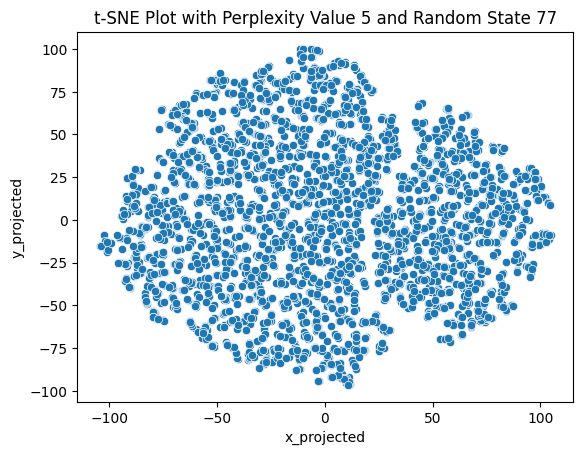

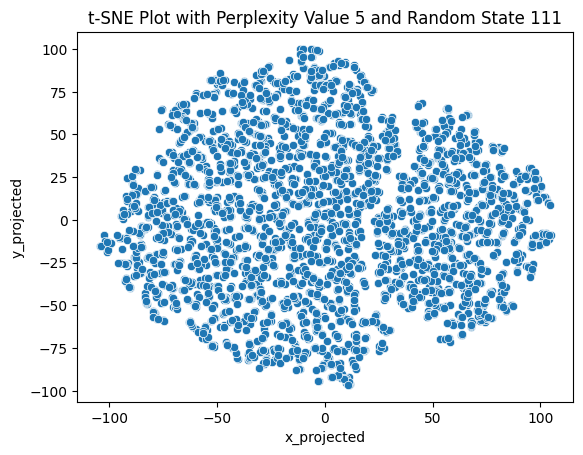

--------------------------------------------


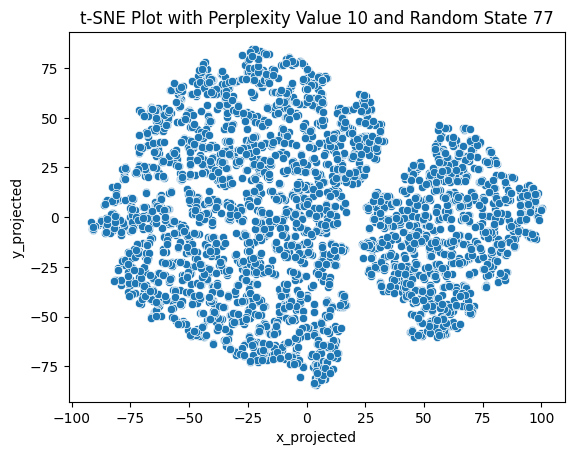

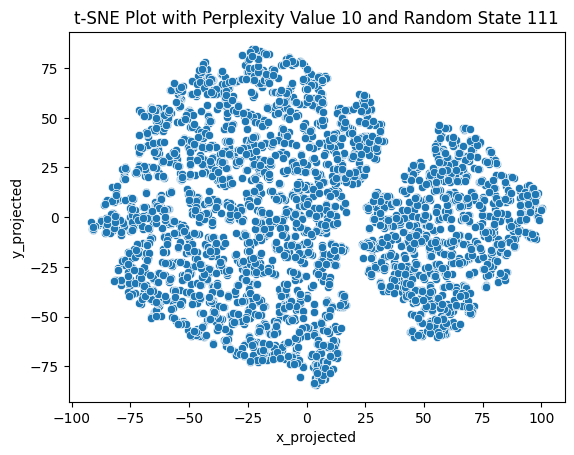

--------------------------------------------


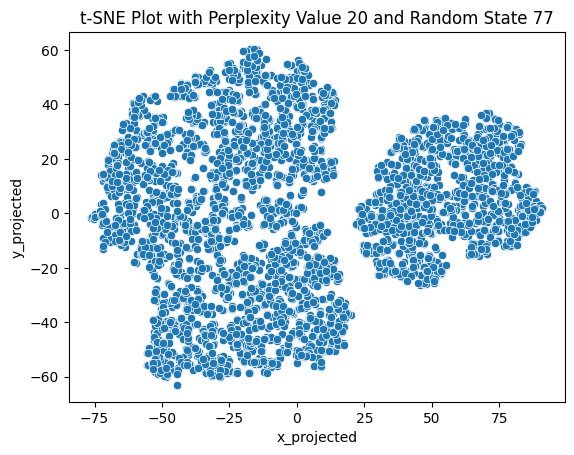

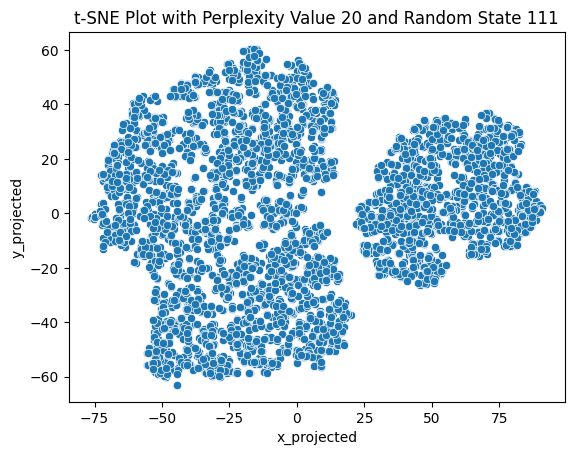

--------------------------------------------


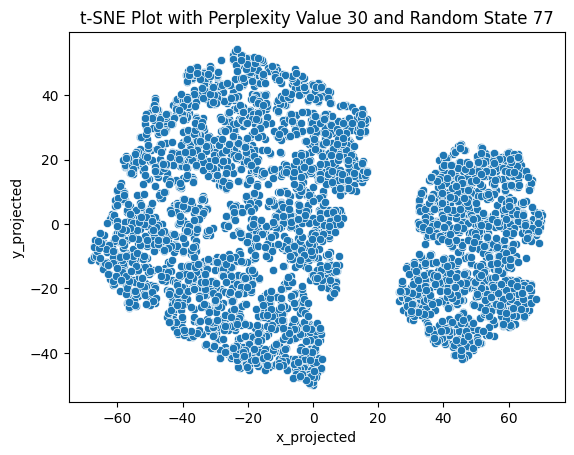

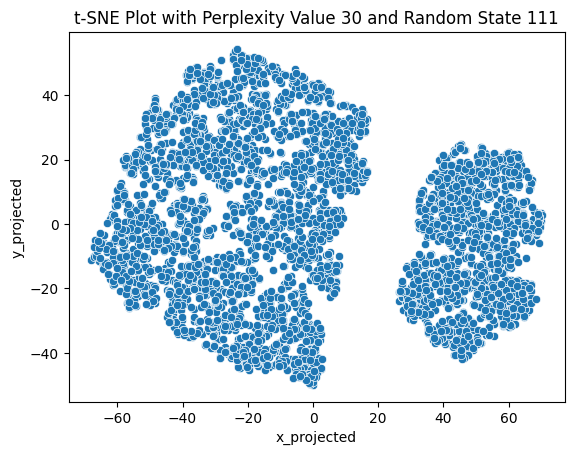

--------------------------------------------


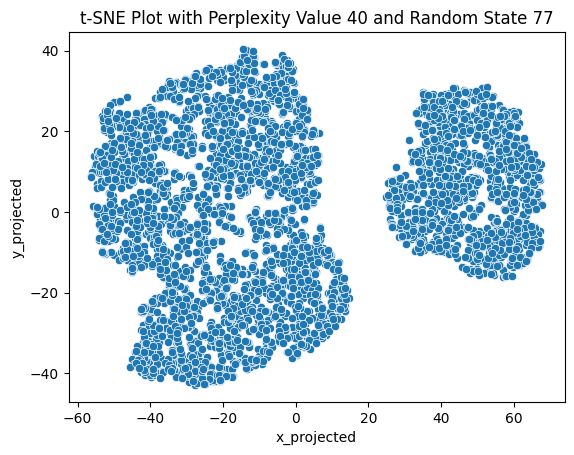

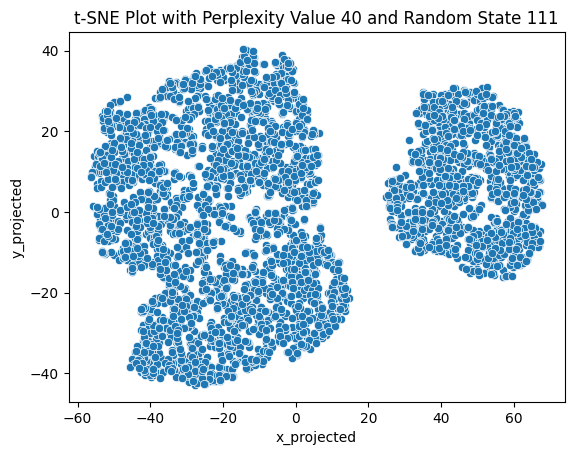

--------------------------------------------


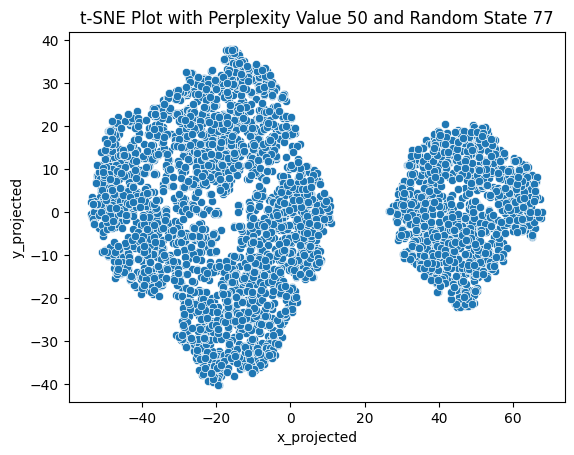

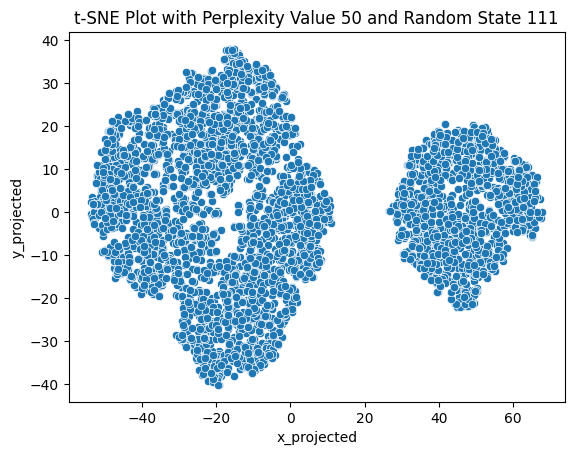

--------------------------------------------


In [ ]:
for perp in [5, 10, 20, 30, 40, 50]:
    for rs in [77, 111]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(X_num)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected', y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

Our t-SNE plots for the numerical variables in the dataset suggest that it is clusterable. There seems to be $k=2$ underlying clusters. The clusters themselves have irregular shapes and are extremely unbalanced in size, with one cluster having significantly more observations than the other. However, they are well-separated from one another. Additionally, there is some evidence of nested cluster relationships as well, especially after taking another look at our basic data exploration.

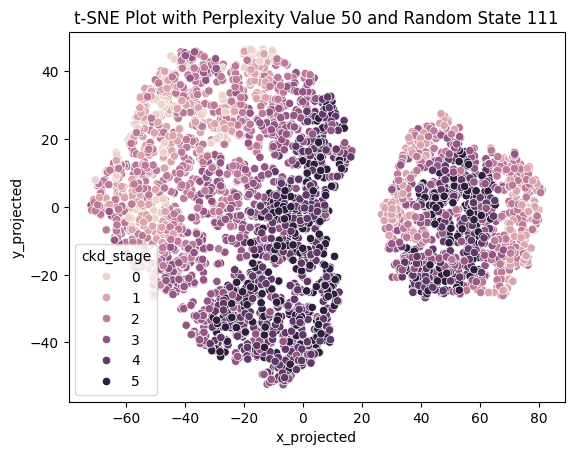

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=111)
data_tsne = tsne.fit_transform(X_num)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected', y='y_projected', hue='ckd_stage', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(30, 111))
plt.show()

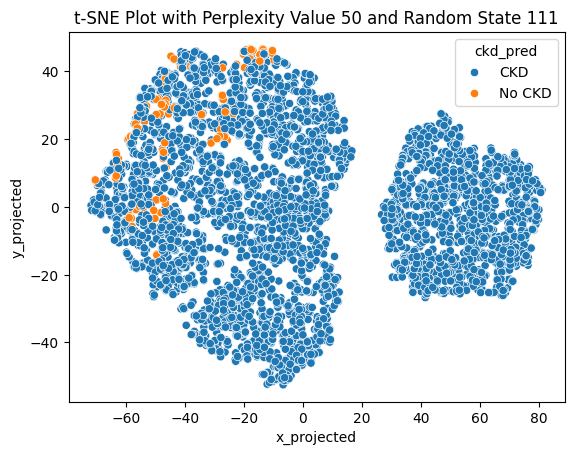

In [ ]:
for var in X_num.columns:
    tsne = TSNE(n_components=2, perplexity=30, random_state=111)
    data_tsne = tsne.fit_transform(X_num)
    df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
    df_combo = pd.concat([df, df_tsne], axis=1)
    sns.scatterplot(x='x_projected', y='y_projected', hue=var, data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(30, 111))
    plt.show()
    print('--------------------------------------------')

for var in X_cat.columns:
    tsne = TSNE(n_components=2, perplexity=30, random_state=111)
    data_tsne = tsne.fit_transform(X_num)
    df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
    df_combo = pd.concat([df, df_tsne], axis=1)
    sns.scatterplot(x='x_projected', y='y_projected', hue=var, data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(30, 111))
    plt.show()
    print('--------------------------------------------')

**CAUTION:** Remember that t-SNE plots cannot help us determine the existence of nosie and outliers, the sparsity of the clusters, the distance between objects, and the distance between clusters.

### 7.0 Clustering Algorithm Selection Motivation

#### 7.1 K-Prototypes
The first clustering algorithm we chose to cluster our dataset with was k-prototypes. Because our dataset contains a mix of both numerical and categorical variables, we felt that k-prototypes with a combined Euclidean and Hamming distance matrix would be the most suitable. Using this algorithm would allow us to tune the $\gamma$ value and adjust how much the categorical and numerical variables each contribute to the clustering structure. K-prototypes works the best with datasets that have clusters of similar sparsity, a similar number of objects in each cluster, spherical shape, good separation, and minimal outliers. Based on our analysis of the clustering structure, our dataset meets most of these criteria (similar sparsity, well-separated, minimal outliers).

K-prototypes also returns a hard-assignment clustering, which we believe will be more beneficial for our research goals compared to fuzzy clustering algorithms. Using a hard clustering assignment, we can provide doctors and researchers with a clearer definition of the characteristics of patients who may be at risk for CKD.

#### 7.2 Hierarchical Agglomerative Clustering
We decided to use hierarchical agglomerative clustering (single, complete, and average linkage) with Gower's distance matrix as our second algorithm. HAC with single linkage tends to be helpful for identifying non-convex clusters and clusters with a different number of observations in them, which the t-SNE plots showed are some of the characteristics of our dataset. HAC with complete linkage is less likely to identify the non-convex clusters but is beneficial for identifying less well-separated clusters, which may help us with clustering the less well-separated sub-clusters present in the inherent clustering structure. Overall, both types of HAC will have both benefits and drawbacks when clustering on our particular dataset--exploring each type will allow us to assess which one performs the best at identifying the inherent clustering structure.

Hierarchical agglomerative clustering uses hard-assignments and will also provide insights into nested clusters and the dissimilarity between each cluster. This will allow us to explore the relationship between the dataset features and the CKD stages in more detail to learn what distinguishes the dissimilar clusters and the nested clusters from each other.

#### 7.3 Fuzzy and Hierarchical Clusterings
A fuzzy clustering of our dataset would not be as helpful as a hard-assignment clustering. Because we want to be able to determine a clear set of symptoms or habits that doctors can use to identify at-risk patients for CKD, we also want our clustering to clearly distinguish the differences between characteristics of patients in different CKD stages.

A hierarchical clustering aligns more with our research goals as it would allow us to create a dendrogram to explore the relationships between nested clusters/sub-clusters within our two main inherent clusters. This may provide us with more information on the characteristics of the six CKD stages, allowing us to formulate a more detailed analysis for doctors to use to inform their treatments.

### 8.0 Clustering Algorithm 1 - K-Prototypes

To format our dataset for k-prototypes clustering, we first encoded our categorical variables:

In [21]:
X_cat_code = X_cat.copy()

label_enc = {}
for col in X_cat.columns:
    label_enc[col] = preprocessing.LabelEncoder()
    print(col)
    X_cat_code[col] = label_enc[col].fit_transform(X_cat[col])
    
X_cat_code.head()

ana
hematuria
physical_activity
diet
smoking
alcohol
painkiller_usage
family_history
weight_changes
stress_level
months
ckd_stage


,ana,hematuria,physical_activity,diet,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage
0,0,0,2,1,1,0,0,1,2,1,9,3
1,1,1,2,1,1,0,0,1,1,2,0,3
2,0,0,2,2,0,0,0,0,2,2,3,5
3,1,1,1,2,0,1,1,1,2,0,8,1
4,1,1,2,0,0,2,1,0,0,0,6,3


In [22]:
df_scaled_encoded = pd.DataFrame(np.hstack([X_num, X_cat_code.values]), columns=[*X_num.columns, *X_cat_code.columns])
df_scaled_encoded

,serum_creatinine,gfr,bun,serum_calcium,c3_c4,oxalate_levels,urine_ph,blood_pressure,water_intake,ana,hematuria,physical_activity,diet,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage
0,-0.712825,-0.546420,-0.748235,1.070476,0.611108,0.233071,1.369625,-0.179368,-0.327237,0.0,0.0,2.0,1.0,1.0,0.0,0.0,1.0,2.0,1.0,9.0,3.0
1,1.854574,-0.554032,2.400610,-0.147484,-1.836193,1.968734,-1.374106,0.412320,-0.437784,1.0,1.0,2.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,3.0
2,-0.334829,-1.444107,-0.549943,0.628234,1.164609,-0.740227,-0.192389,-0.861414,0.063476,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,2.0,2.0,3.0,5.0
3,2.672443,1.690735,0.328579,-0.698917,-0.831377,1.311063,-1.039941,0.889120,0.232691,1.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,2.0,0.0,8.0,1.0
4,2.767387,-0.276890,2.231973,-0.889342,-1.855477,0.566297,-1.427310,1.277608,1.105849,1.0,1.0,2.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,6.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,-0.660870,0.099535,-0.485212,0.087840,0.672488,-0.169604,1.356370,-0.296567,0.504192,0.0,0.0,2.0,2.0,0.0,1.0,0.0,1.0,0.0,2.0,3.0,3.0
3996,-0.425510,1.042465,-0.723137,0.255361,0.853932,-0.024744,1.046344,-0.370307,-1.407554,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,9.0,2.0
3997,-0.604075,0.707908,-0.483730,0.940913,1.040551,-0.282907,0.840779,0.009599,0.746267,0.0,0.0,2.0,2.0,0.0,2.0,0.0,1.0,1.0,0.0,7.0,2.0
3998,0.360739,1.459330,1.461132,-0.314191,-1.497784,1.398730,-1.371463,0.916483,1.097826,1.0,1.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,7.0,1.0


#### 8.1 Parameter selection: $\gamma$ value and number of clusters

1
2
3
4
5
6
7
8
9
10
11


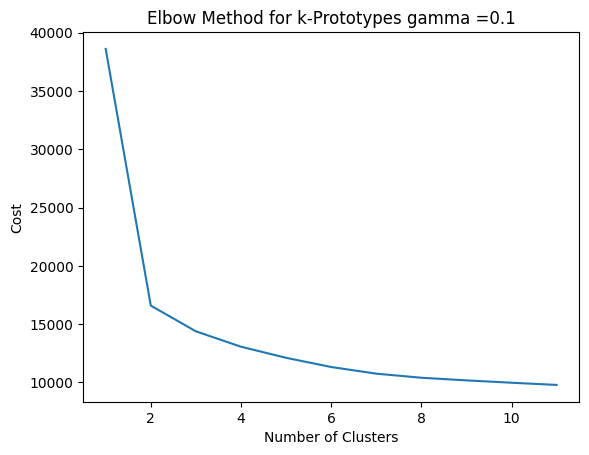

1
2
3
4
5
6
7
8
9
10
11


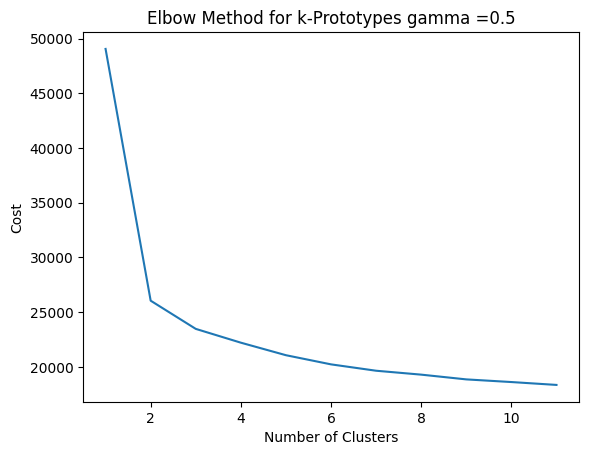

1
2
3
4
5
6
7
8
9
10
11


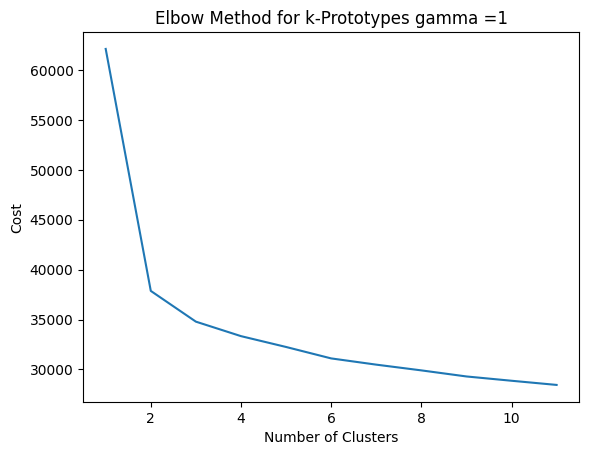

1
2
3
4
5
6
7
8
9
10
11


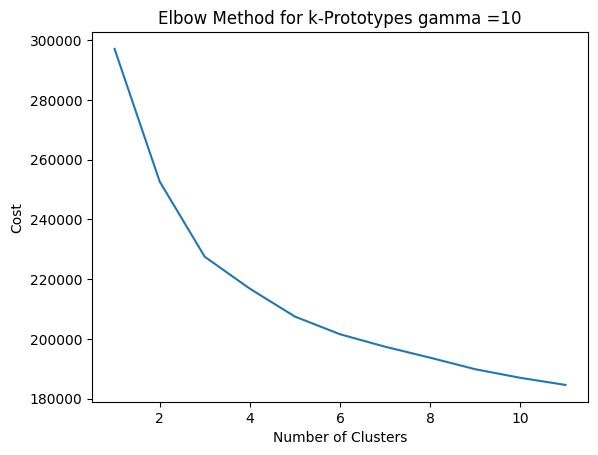

1
2
3
4
5
6
7
8
9
10
11


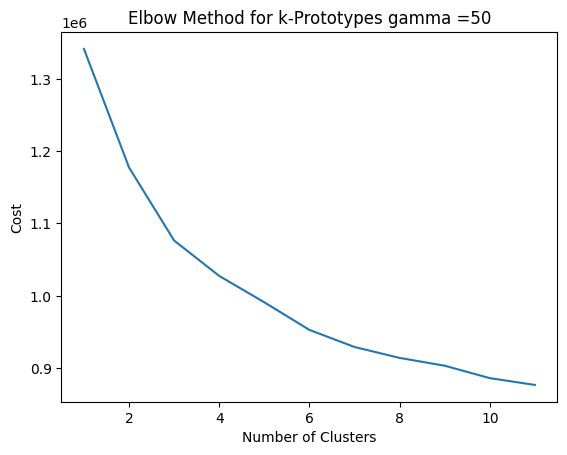

In [113]:
for g in [0.1,0.5,1,10,50]:
    cost = []
    for num_clusters in list(range(1,12)):
        print(num_clusters)
        kp = KPrototypes(n_clusters=num_clusters, gamma=g, random_state=100)
        kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
        cost.append(kp.cost_)

    plt.plot(list(range(1,12)),cost)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Cost')
    plt.title('Elbow Method for k-Prototypes ' + 'gamma =' + str(g))
    plt.show()

Values of $\gamma < 1$ where numerical variables are weighted more heavily show a strong elbow for k=2 clusters. As $\gamma$ increases below 1, there is a stronger clustering structure with k=3 clusters. As $\gamma$ increases above 1, there is less evidence of a clustering structure overall, but we see some evidence of a clustering using k=6 clusters.

Since there is evidence of clustering structures for both high and low $\gamma$ values, we will explore clustering with $\gamma = 0.5$, $\gamma = 1$, and $\gamma = 10$.

#### 8.2 Clustering the data

After selecting values for the parameters ($\gamma$ and k clusters), we created t-SNE plots for $\gamma = 0.5, 1, 10$ to visualize the inherent clustering structure for each $\gamma$ value. Then, we performed k-prototypes clustering on the dataset using each value for $\gamma$ and k clusters we selected.

**Distance Matrix with $\gamma = 0.5$**:

In [27]:
num_dist = squareform(pdist(X_num, 'euclidean'))**2
num_dist

array([[ 0.        , 34.88242201,  5.49502299, ...,  3.59036502,
        28.52561995, 43.25332993],
       [34.88242201,  0.        , 34.5066158 , ..., 36.9568911 ,
        10.24728633, 15.34496756],
       [ 5.49502299, 34.5066158 ,  0.        , ...,  7.32264692,
        31.13084162, 46.5372159 ],
       ...,
       [ 3.59036502, 36.9568911 ,  7.32264692, ...,  0.        ,
        21.96437597, 40.05397489],
       [28.52561995, 10.24728633, 31.13084162, ..., 21.96437597,
         0.        , 14.26237542],
       [43.25332993, 15.34496756, 46.5372159 , ..., 40.05397489,
        14.26237542,  0.        ]])

In [28]:
cat_dist = squareform(pdist(X_cat_code, 'hamming'))
cat_dist

array([[0.        , 0.41666667, 0.5       , ..., 0.58333333, 0.83333333,
        0.66666667],
       [0.41666667, 0.        , 0.66666667, ..., 0.66666667, 0.58333333,
        0.33333333],
       [0.5       , 0.66666667, 0.        , ..., 0.5       , 0.83333333,
        0.41666667],
       ...,
       [0.58333333, 0.66666667, 0.5       , ..., 0.        , 0.41666667,
        0.5       ],
       [0.83333333, 0.58333333, 0.83333333, ..., 0.41666667, 0.        ,
        0.41666667],
       [0.66666667, 0.33333333, 0.41666667, ..., 0.5       , 0.41666667,
        0.        ]])

In [29]:
cat_dist = squareform(pdist(X_cat_code, 'hamming'))*12
cat_dist

array([[ 0.,  5.,  6., ...,  7., 10.,  8.],
       [ 5.,  0.,  8., ...,  8.,  7.,  4.],
       [ 6.,  8.,  0., ...,  6., 10.,  5.],
       ...,
       [ 7.,  8.,  6., ...,  0.,  5.,  6.],
       [10.,  7., 10., ...,  5.,  0.,  5.],
       [ 8.,  4.,  5., ...,  6.,  5.,  0.]])

In [30]:
gamma = 0.5
dist_gamma_05 = num_dist+gamma*cat_dist
dist_gamma_05

array([[ 0.        , 37.38242201,  8.49502299, ...,  7.09036502,
        33.52561995, 47.25332993],
       [37.38242201,  0.        , 38.5066158 , ..., 40.9568911 ,
        13.74728633, 17.34496756],
       [ 8.49502299, 38.5066158 ,  0.        , ..., 10.32264692,
        36.13084162, 49.0372159 ],
       ...,
       [ 7.09036502, 40.9568911 , 10.32264692, ...,  0.        ,
        24.46437597, 43.05397489],
       [33.52561995, 13.74728633, 36.13084162, ..., 24.46437597,
         0.        , 16.76237542],
       [47.25332993, 17.34496756, 49.0372159 , ..., 43.05397489,
        16.76237542,  0.        ]])

**t-SNE Plots with $\gamma = 0.5$ Distance Matrix**:

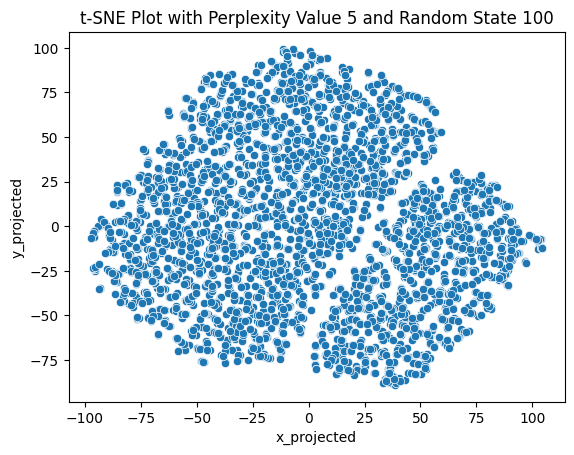

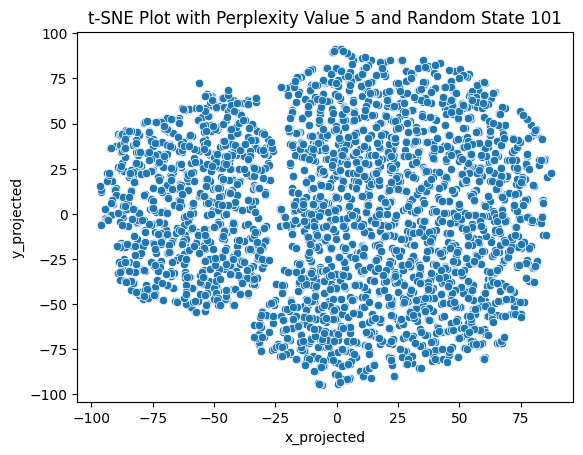

--------------------------------------------


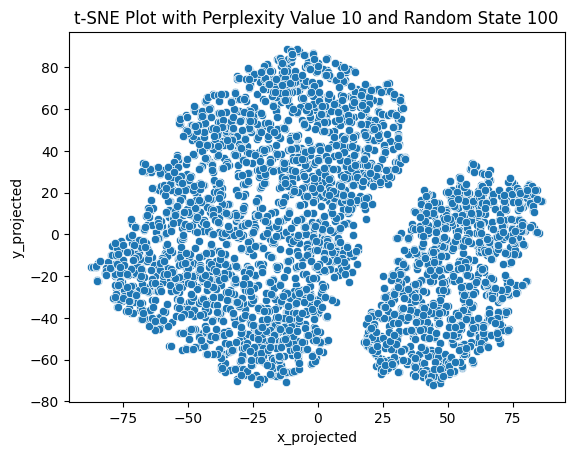

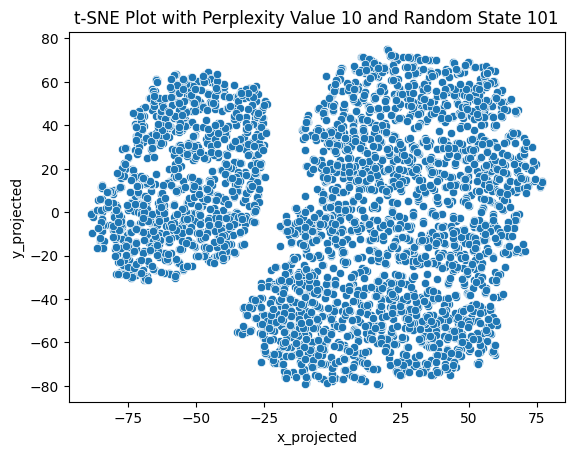

--------------------------------------------


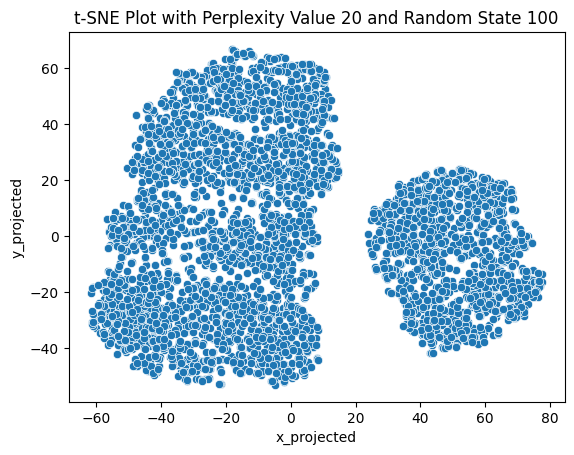

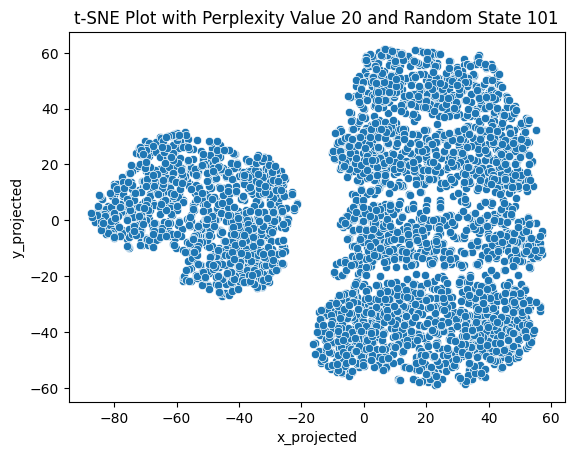

--------------------------------------------


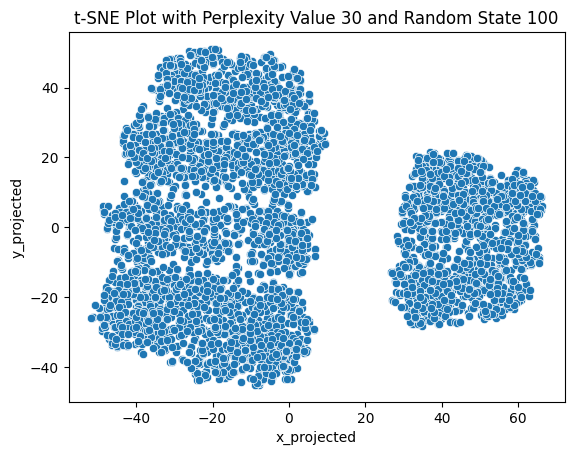

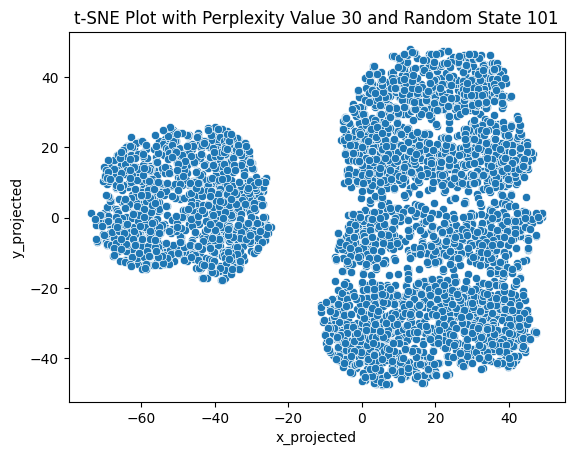

--------------------------------------------


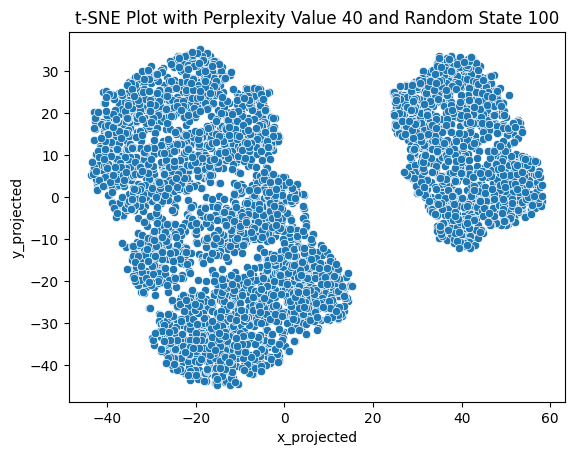

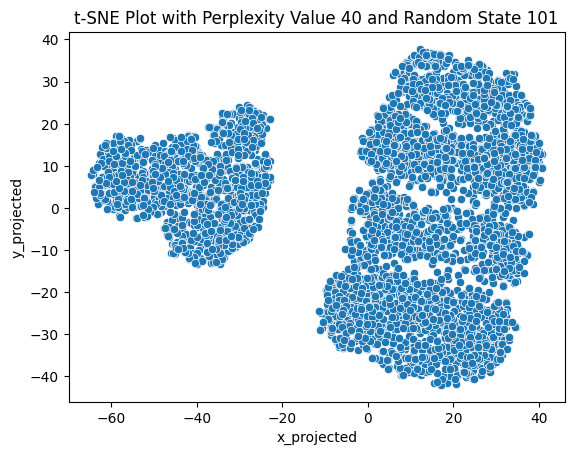

--------------------------------------------


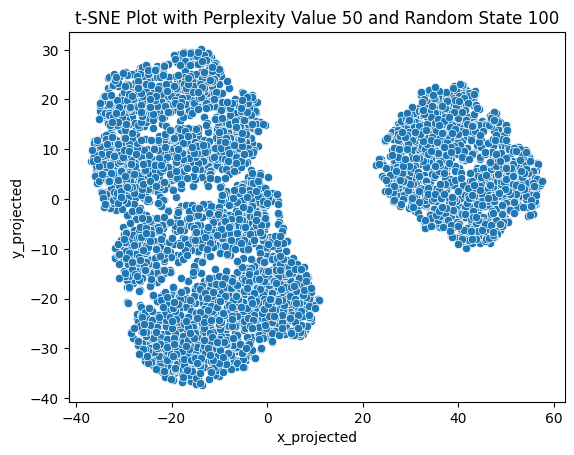

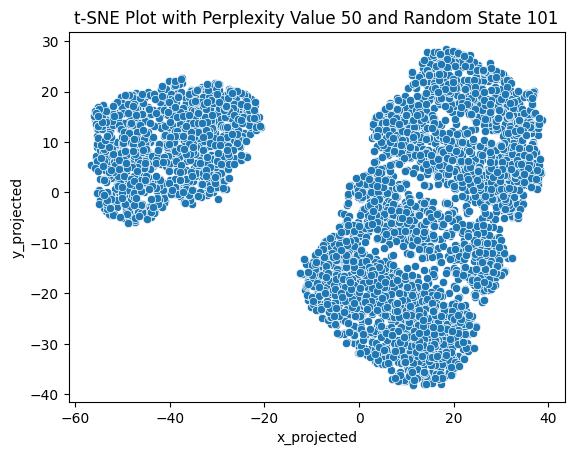

--------------------------------------------


In [26]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [100,101]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed', init ='random')
        data_tsne = tsne.fit_transform(dist_gamma_05)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

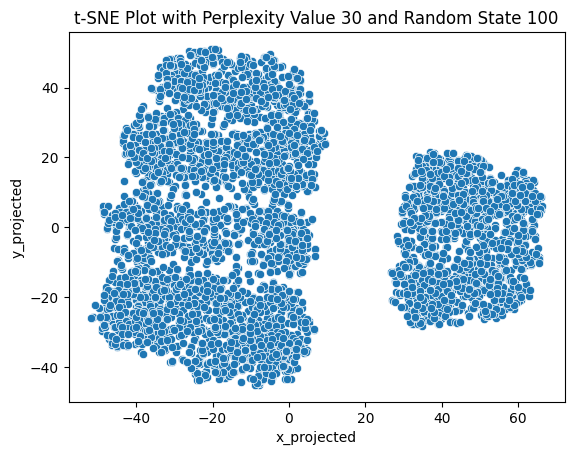

In [48]:
perp = 30
rs = 100
tsne = TSNE(n_components=2, perplexity=30, random_state=100, metric='precomputed', init ='random')
data_tsne = tsne.fit_transform(dist_gamma_05)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

The t-SNE plots show potential evidence of a clustering structure with k=2. There also seems to be inherent subclusters within the dataset that are not as well-separated as the two main clusters identified by the t-SNE plots. The elbow plot for $\gamma = 0.5$ suggests k=2 and k=3 clustering so we will try using k-prototypes on these two values. 

**K-prototypes with k=2 clusters, $\gamma = 0.5$**:

In [31]:
kp = KPrototypes(n_clusters=2, gamma=0.5, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])

In [32]:
df_combo['predicted_cluster']=fit_clusters

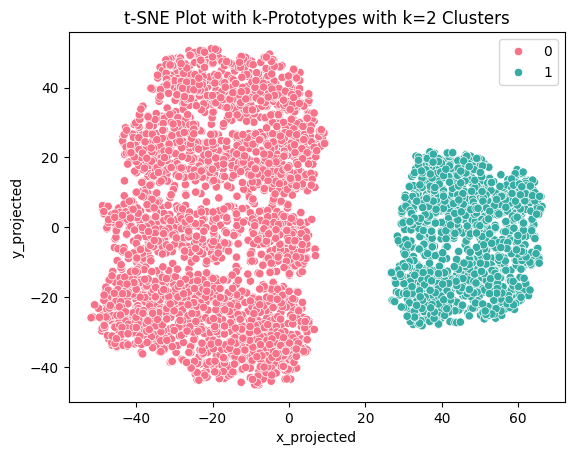

In [59]:
k=2
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

**K-prototypes with k=3 clusters, $\gamma = 0.5$**:

In [49]:
kp = KPrototypes(n_clusters=3, gamma=0.5, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
df_combo['predicted_cluster']=fit_clusters

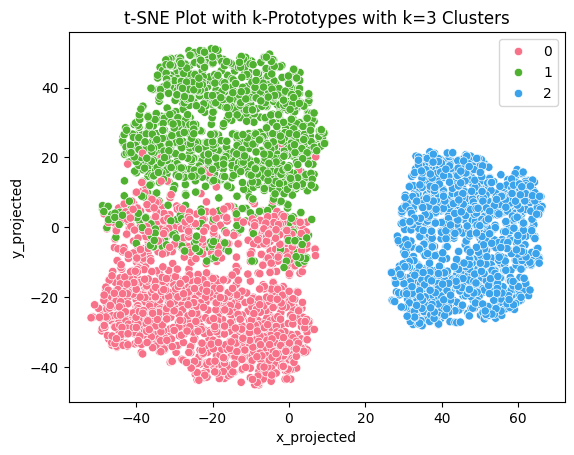

In [61]:
k=3
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Both k-prototypes with k=2 and k=3 were able to identify the two well-separated clusters shown in the t-SNE plots but the k=3 clustering structure performed better when identifying the inherent subclusters within the dataset. 

However, there still seems to be some less well-separated subclusters that k-prototypes was unable to identify using $\gamma = 0.5, k=2,3$. We will try setting $\gamma = 1$ next.

**Distance Matrix with $\gamma = 1$**:

In [62]:
gamma = 1
dist_gamma_1 = num_dist+gamma*cat_dist
dist_gamma_1

array([[ 0.        , 39.88242201, 11.49502299, ..., 10.59036502,
        38.52561995, 51.25332993],
       [39.88242201,  0.        , 42.5066158 , ..., 44.9568911 ,
        17.24728633, 19.34496756],
       [11.49502299, 42.5066158 ,  0.        , ..., 13.32264692,
        41.13084162, 51.5372159 ],
       ...,
       [10.59036502, 44.9568911 , 13.32264692, ...,  0.        ,
        26.96437597, 46.05397489],
       [38.52561995, 17.24728633, 41.13084162, ..., 26.96437597,
         0.        , 19.26237542],
       [51.25332993, 19.34496756, 51.5372159 , ..., 46.05397489,
        19.26237542,  0.        ]])

**t-SNE Plots with $\gamma = 1$ Distance Matrix**:

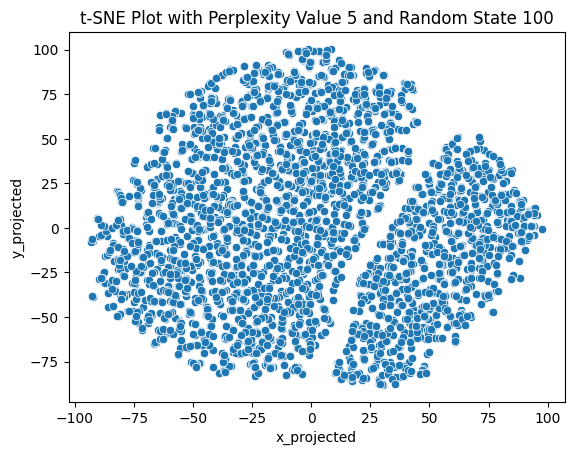

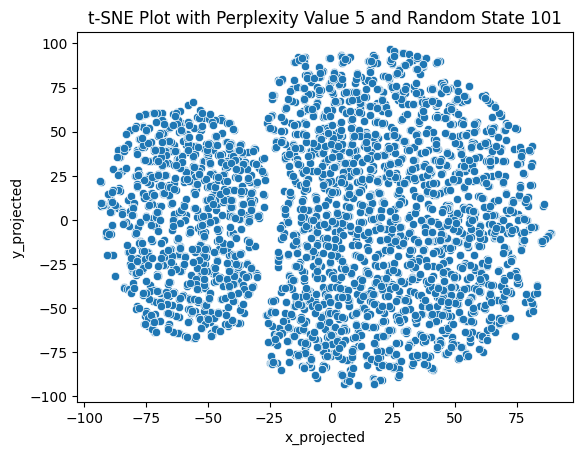

--------------------------------------------


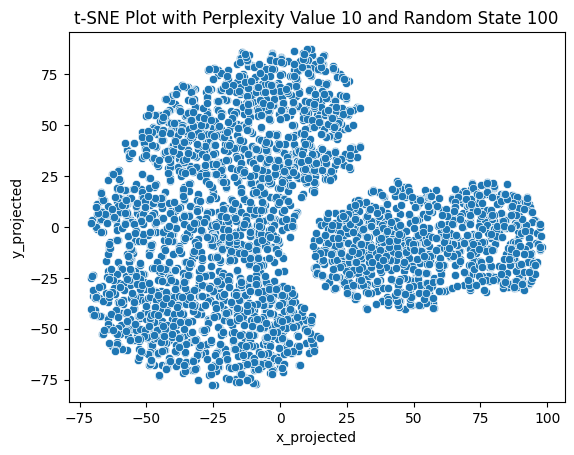

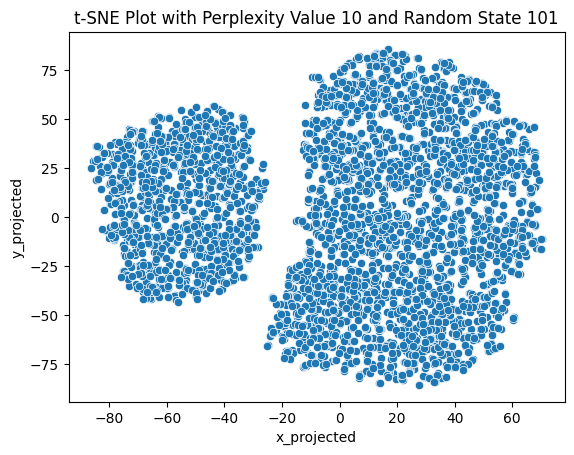

--------------------------------------------


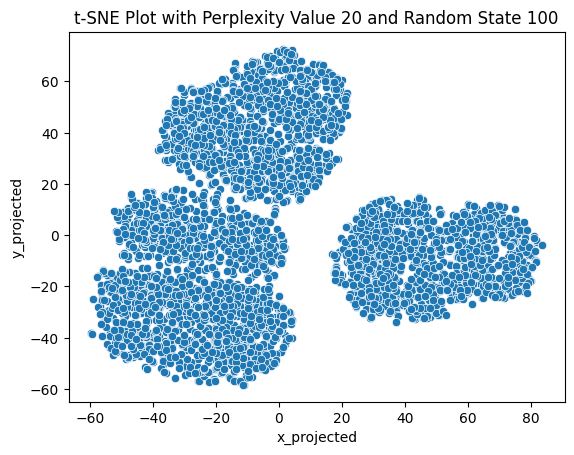

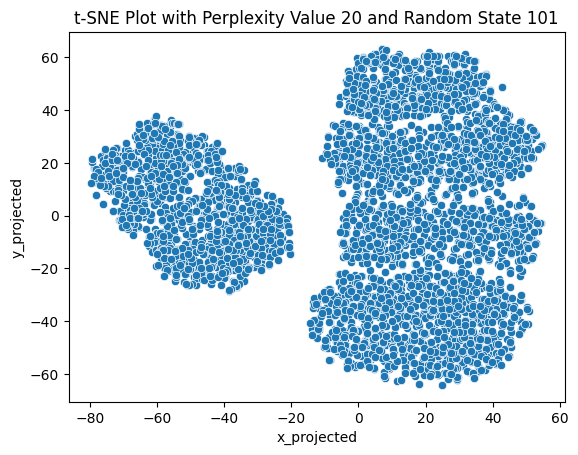

--------------------------------------------


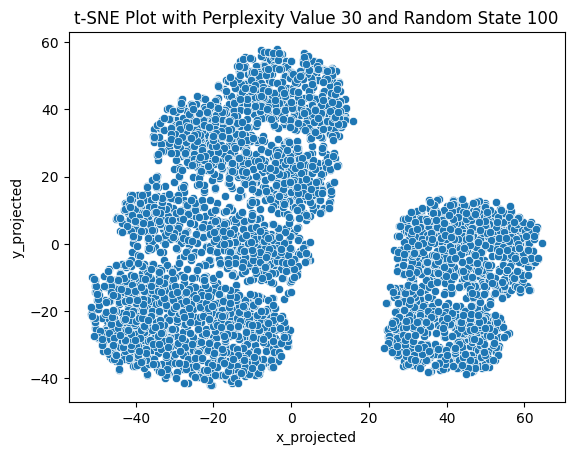

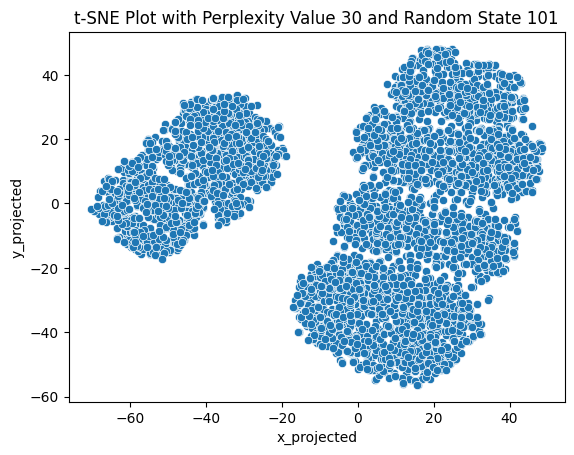

--------------------------------------------


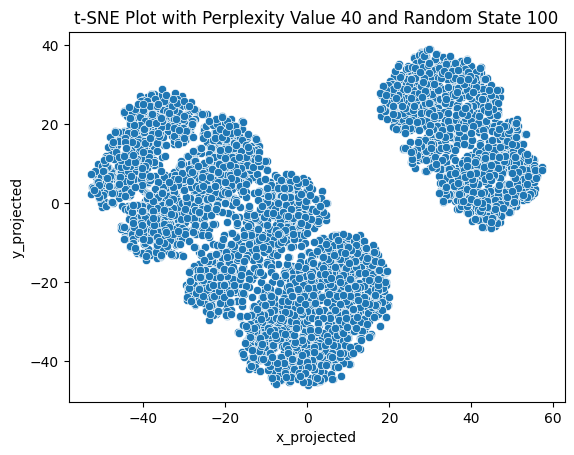

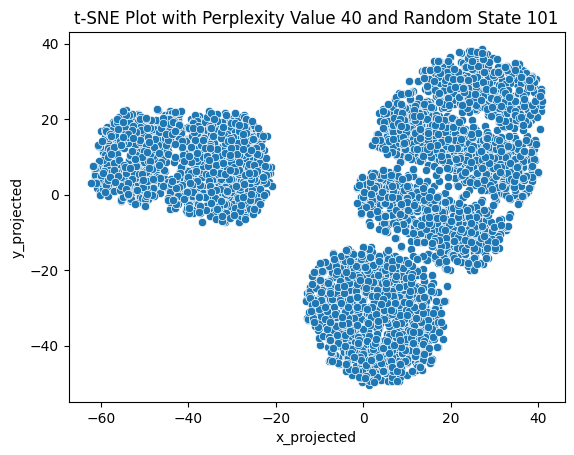

--------------------------------------------


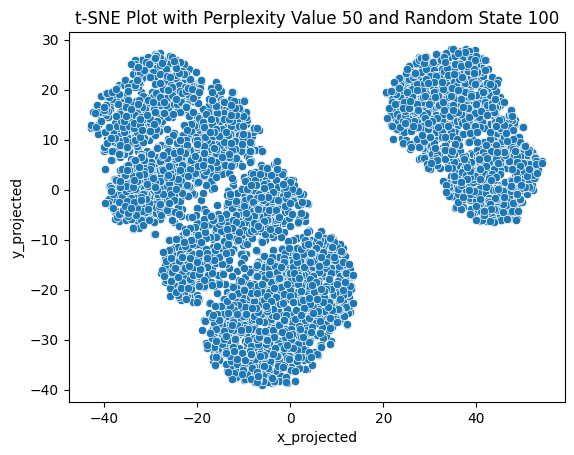

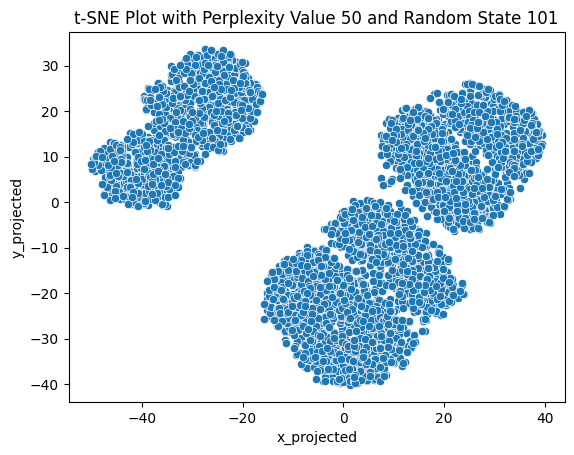

--------------------------------------------


In [45]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [100,101]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed', init ='random')
        data_tsne = tsne.fit_transform(dist_gamma_1)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

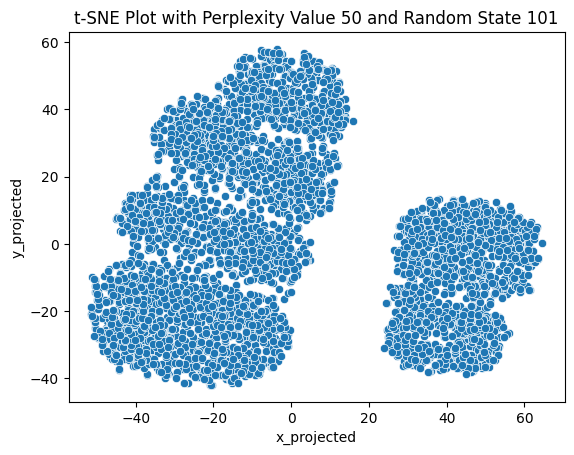

In [116]:
perp = 50
rs = 101
tsne = TSNE(n_components=2, perplexity=30, random_state=100, metric='precomputed', init ='random')
data_tsne = tsne.fit_transform(dist_gamma_1)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

The t-SNE plots show strong evidence of a clustering structure for k=3 and k=6 clusters. Similarly to the t-SNE plots using $\gamma = 0.5$, they also show that there may be inherent subclusters within the dataset that are less well-separated. Both the elbow plot and t-SNE plots for $\gamma = 1$ suggests using k=3 clusters. The t-SNE plot shows that k=6 clusters might work as well, so we tried clustering with both values of k.

**K-protoypes with k=3 clusters, $\gamma = 1$**:

In [65]:
kp = KPrototypes(n_clusters=3, gamma=1, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
df_combo['predicted_cluster']=fit_clusters

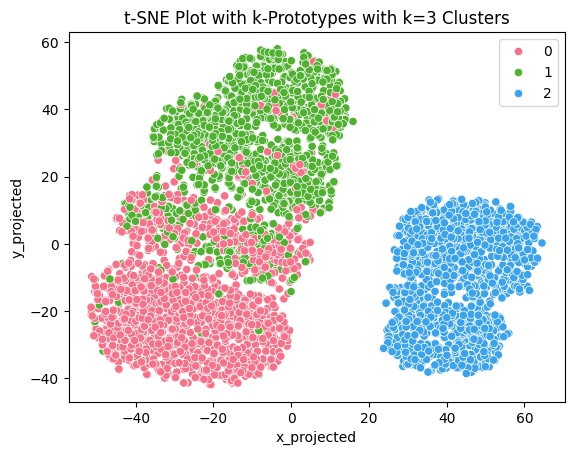

In [66]:
k=3
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Using k=3 clusters and $\gamma = 1$, we can see that the k-prototypes algorithm was able to identify one of the main clusters shown in the t-SNE plot. The other two clusters are less well-separated and k-prototypes seems to have some overlap between them.

**K-protoypes with k=6 clusters, $\gamma = 1$**:

In [67]:
kp = KPrototypes(n_clusters=6, gamma=1, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
df_combo['predicted_cluster']=fit_clusters

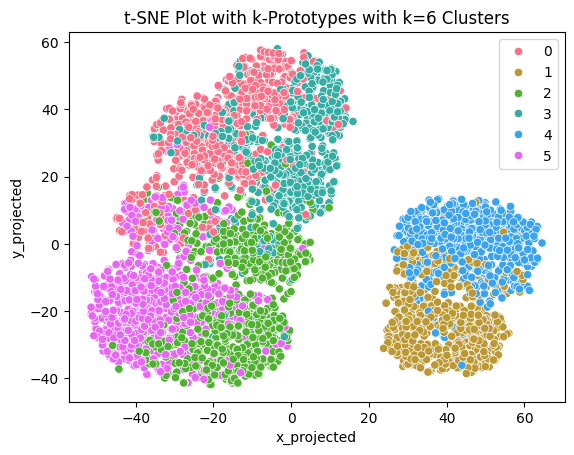

In [68]:
k=6
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

The k-prototypes algorithm was able to identify two of the potential subclusters (labeled 1, 4) but did a worse job at clustering the less well-separated ones. Overall, k-prototypes with $\gamma = 1, k=3$ performed similarly to k-prototypes with $\gamma = 0.5, k=3$, while increasing the number of clusters to k=6 worsened the algorithm's performance. The algorithm was able to identify the main clustering structure, but had trouble identifying the subclusters that were not well-separated.

**Distance Matrix with $\gamma = 10$**:

In [69]:
gamma = 10
dist_gamma_10 = num_dist+gamma*cat_dist
dist_gamma_10

array([[  0.        ,  84.88242201,  65.49502299, ...,  73.59036502,
        128.52561995, 123.25332993],
       [ 84.88242201,   0.        , 114.5066158 , ..., 116.9568911 ,
         80.24728633,  55.34496756],
       [ 65.49502299, 114.5066158 ,   0.        , ...,  67.32264692,
        131.13084162,  96.5372159 ],
       ...,
       [ 73.59036502, 116.9568911 ,  67.32264692, ...,   0.        ,
         71.96437597, 100.05397489],
       [128.52561995,  80.24728633, 131.13084162, ...,  71.96437597,
          0.        ,  64.26237542],
       [123.25332993,  55.34496756,  96.5372159 , ..., 100.05397489,
         64.26237542,   0.        ]])

**t-SNE Plots with $\gamma = 10$ Distance Matrix**:

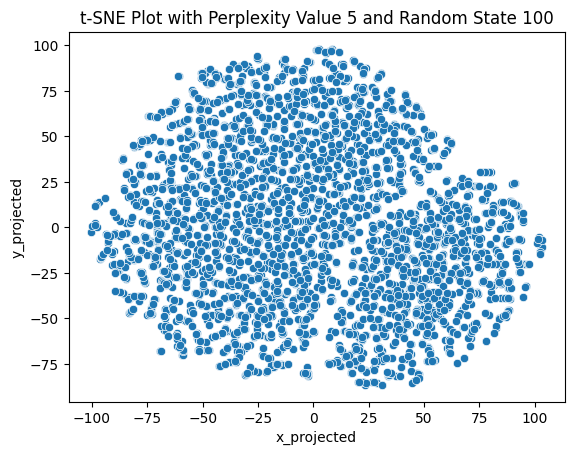

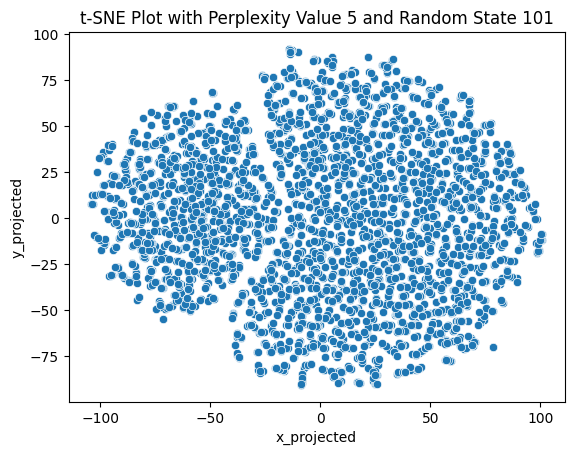

--------------------------------------------


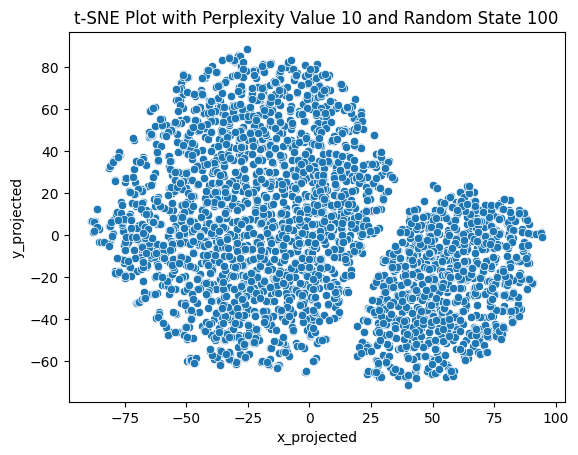

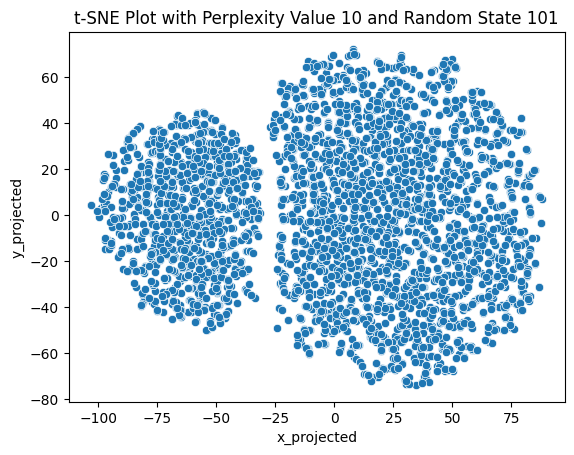

--------------------------------------------


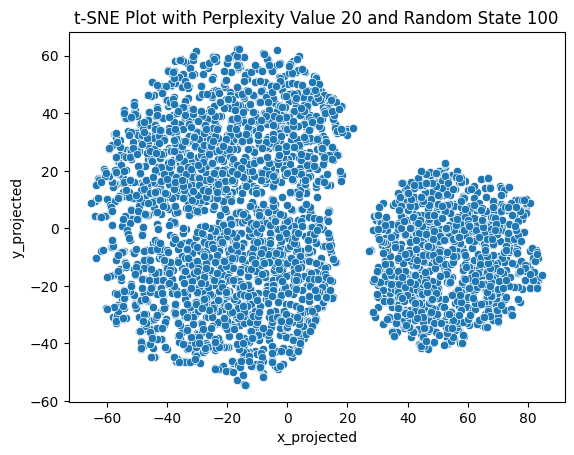

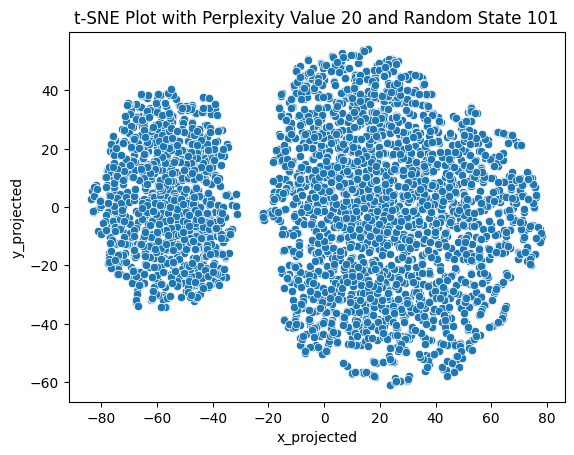

--------------------------------------------


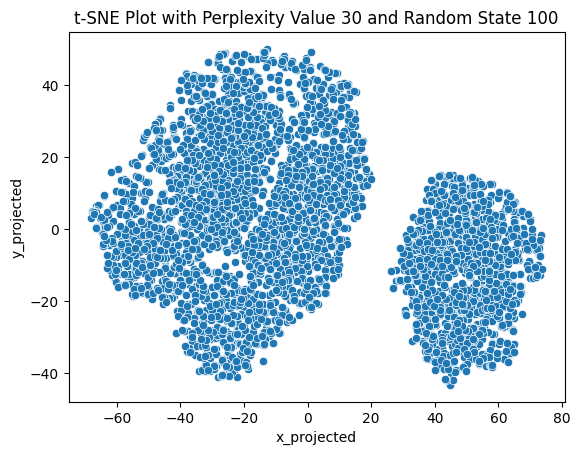

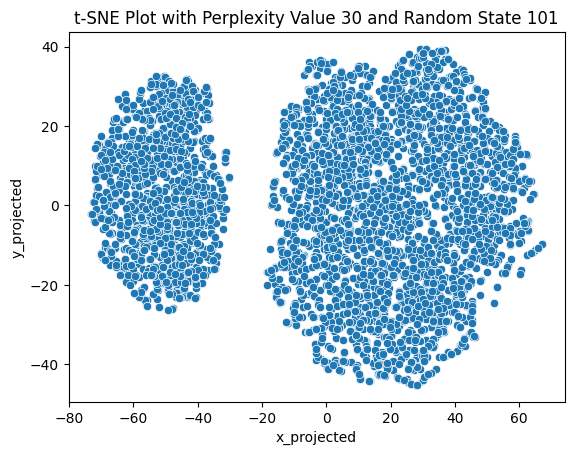

--------------------------------------------


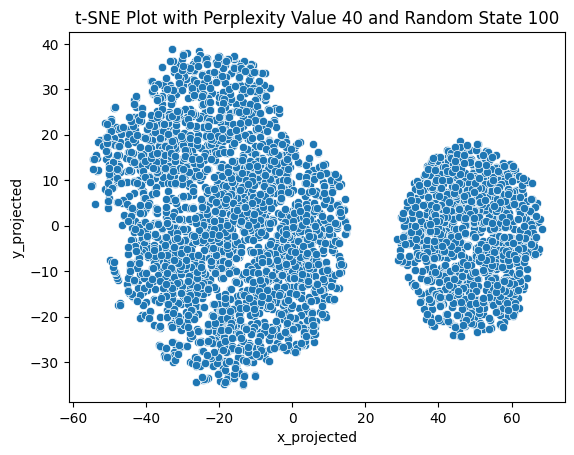

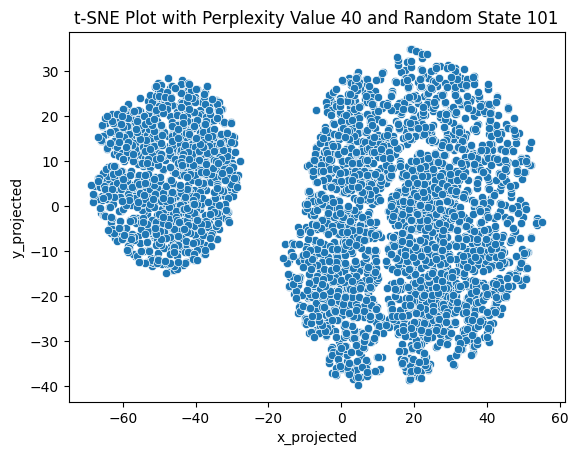

--------------------------------------------


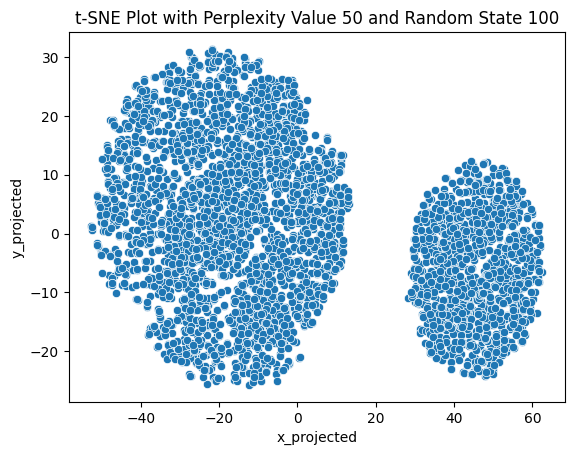

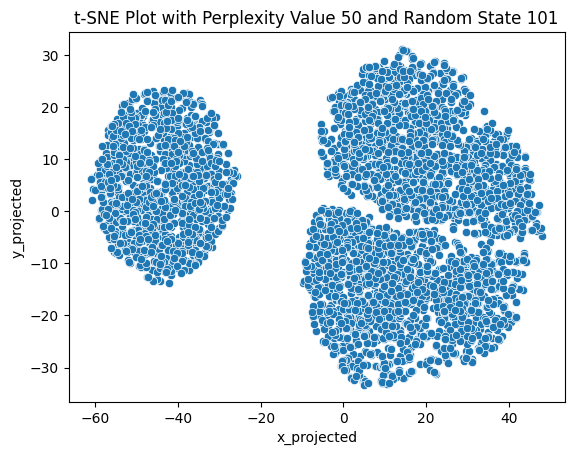

--------------------------------------------


In [70]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [100,101]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed', init ='random')
        data_tsne = tsne.fit_transform(dist_gamma_10)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

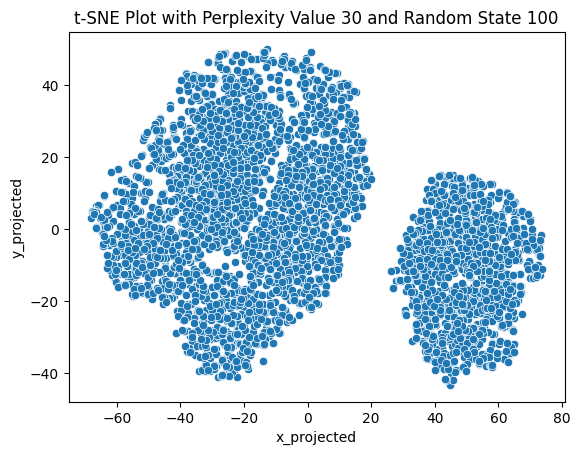

In [117]:
perp = 30
rs = 100
tsne = TSNE(n_components=2, perplexity=30, random_state=100, metric='precomputed', init ='random')
data_tsne = tsne.fit_transform(dist_gamma_10)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

Using $\gamma = 10$, there appears to be less of a clear clustering structure compared to the other gamma values. The t-SNE plot suggests that there are two main clusters and potentially 3-5 less well-separated subclusters within this structure. The k-prototypes elbow plot has the strongest elbows at k=3 and k=5, which does agree with the t-SNE plot above:

**K-protoypes with k=3 clusters, $\gamma = 10$**:

In [72]:
kp = KPrototypes(n_clusters=3, gamma=10, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
df_combo['predicted_cluster']=fit_clusters

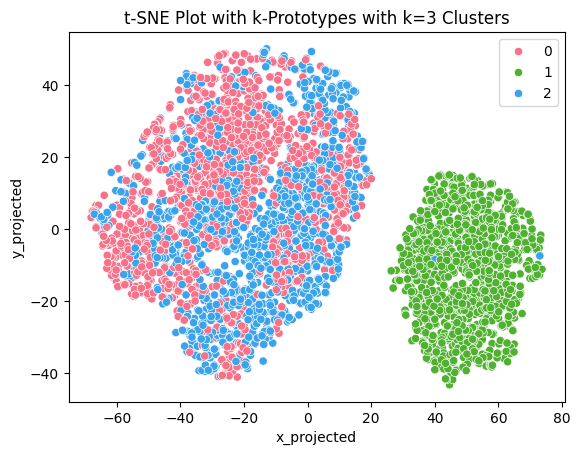

In [73]:
k=3
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

**K-protoypes with k=5 clusters, $\gamma = 10$**:

In [74]:
kp = KPrototypes(n_clusters=5, gamma=10, random_state=100)
fit_clusters = kp.fit_predict(X, categorical=[4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])
df_combo['predicted_cluster']=fit_clusters

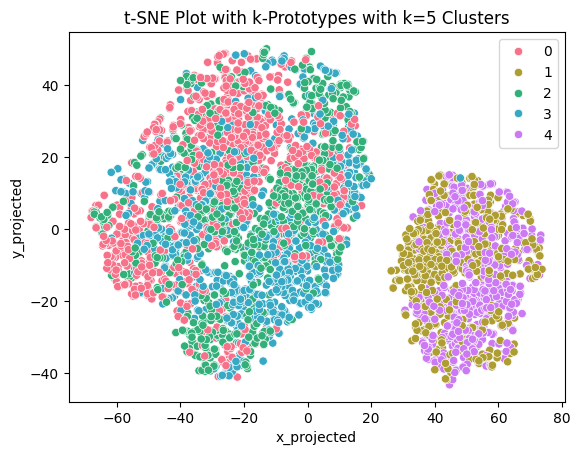

In [76]:
k=5
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                data=df_combo)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Based on the t-SNE plots, k-prototypes did slightly worse at identifying the main clusters using $\gamma = 10$ compared to $\gamma = 0.5$ and $\gamma = 1$.

Overall, the k-prototypes clustering algorithm seemed to perform worse with the larger values of $\gamma$. The algorithm was also unable to identify the inherent clustering structure when we increased the number of clusters. 

#### 8.3 K-Prototypes Clustering Results

The final clustering we chose to use was the k-prototypes clustering with gamma=0.5 and k=3 clusters. Plotting the t-SNE plot with the predicted cluster labels, we can see that k-prototypes was able to identify some of the inherent clustering structure. 

The algorithm did not split any of the inherent clusters, however, there does seem to be some subclusters within the three identified that the k-prototypes algorithm was unable to detect. For example, cluster 0 and cluster 1 both contain observations that could belong in their own cluster since there appears to be a distinct separation between the ellipsoidal shapes that form those two main clusters.

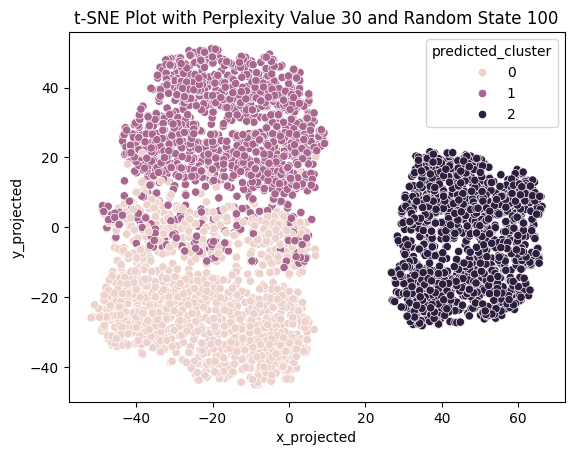

In [50]:
kp_final = KPrototypes(n_clusters = 3, random_state = 100, gamma = .5)
pred_cluster = kp_final.fit_predict(X, categorical = [4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])

df_combo['predicted_cluster'] = pred_cluster

sns.scatterplot(x = 'x_projected', y = 'y_projected', data = df_combo, hue = 'predicted_cluster')
plt.title('t-SNE Plot with Perplexity Value 30 and Random State 100')
plt.show()

#### 8.4 Additional cluster exploration

To assess the overall cohesion and separation of our final k-prototypes clustering, we created a cluster-sorted similarity matrix and a silhouette plot.

Based on the similarity matrix of our clusters, cluster 0 and cluster 1 are the closest to each other. The distance between observations in clusters 0 and 1 is closer on average compared to the distance between observations from cluster 2 with cluster 0/1. Cluster 2 also has greater sparsity compared to clusters 0 and 1. The average distance between observations within cluster 2 is slightly greater than the average distance between observations within cluster 0 and cluster 1.

The silhouette plot shows that cluster 2 has a slightly higher silhouette score on average compared to cluster 0 and cluster 1, indicating that it is more cohesive and well-separated overall. Cluster 0 and cluster 1 also have some negative silhouette scores which shows that some observations from these two clusters may be closer to observations in another cluster. 

Based on our dataset and cluster properties, these two methods of measuring cohesion and separation are likely to be effective. Our dataset does not have any significant outliers, the clusters are convex, and the clusters are all at similar distances from each other. 

In [113]:
X_num = df_combo[['serum_creatinine', 'gfr', 'bun', 'serum_calcium', 'c3_c4', 'oxalate_levels', 'urine_ph', 'blood_pressure', 'x_projected', 'y_projected', 'pred_cluster']]

X_cat_code = df_combo[['ana', 'hematuria', 'physical_activity', 'diet', 'smoking', 'alcohol', 'painkiller_usage', 'family_history', 'weight_changes', 'stress_level', 'months', 'ckd_stage']].copy()

label_enc = {}
for col in X_cat_code.columns:
    label_enc[col] = preprocessing.LabelEncoder()
    X_cat_code[col] = label_enc[col].fit_transform(X_cat[col])
    
X_cat_code.head()

df_scaled_encoded = pd.DataFrame(np.hstack([X_num, X_cat_code.values]), columns=[*X_num.columns, *X_cat_code.columns])

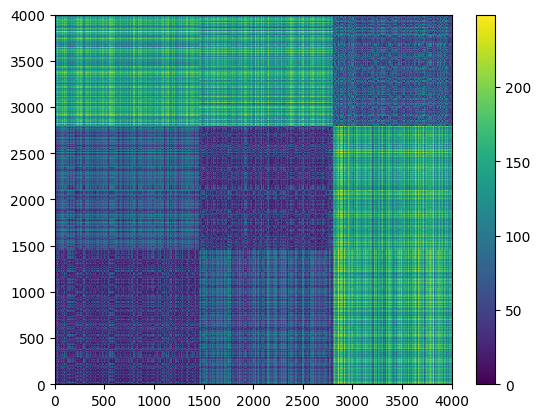

In [ ]:
# Cluster sorted similarity matrix
df_sort=df_scaled_encoded.sort_values(by=['predicted_cluster'])
df_sort=df_sort.drop(['x_projected', 'y_projected', 'predicted_cluster', 'ckd_stage'], axis=1)

dist_mat = squareform(pdist(df_sort))
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

In [122]:
# Create silhouette plot function
def show_silhouette_plots(X,cluster_labels):
    import matplotlib.cm as cm
    n_clusters=len(np.unique(cluster_labels))    

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()
    return

For n_clusters = 3 The average silhouette_score is : 0.1383438414702619


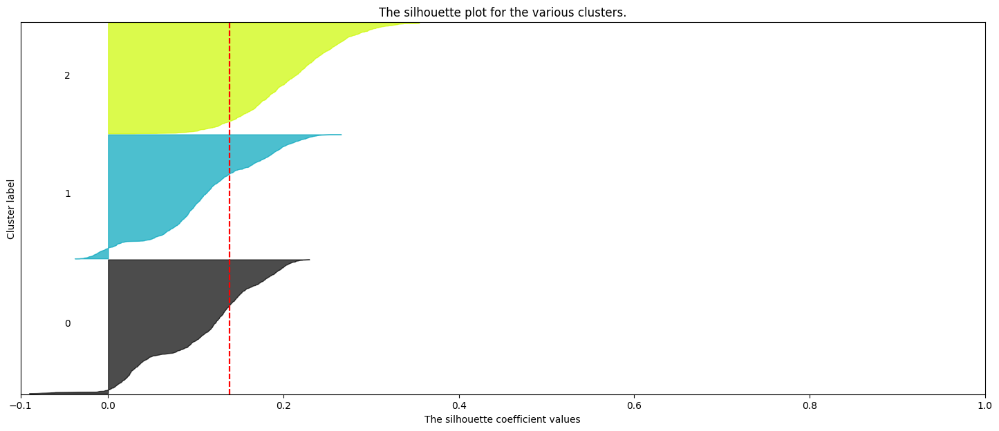

In [ ]:
show_silhouette_plots(df_scaled_encoded, df_combo['predicted_cluster'])

#### 8.5 Descriptive analysis of each cluster

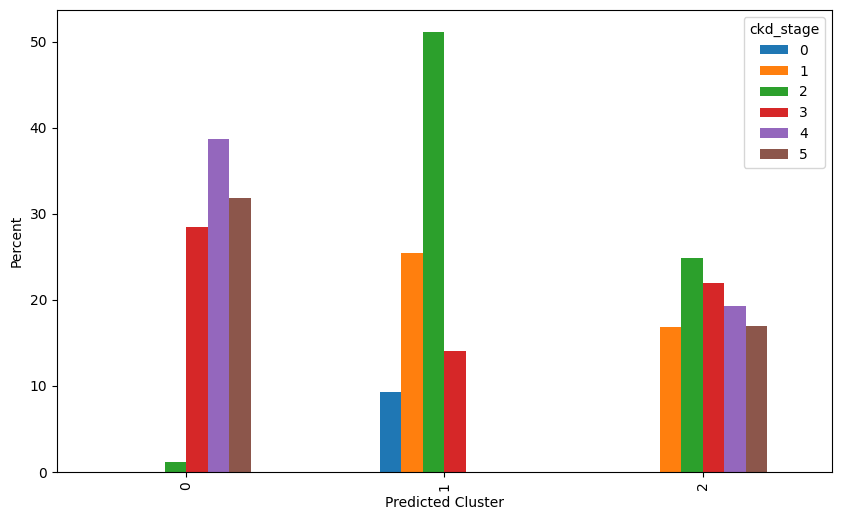

In [139]:
pred = pd.crosstab(df_combo['predicted_cluster'], df_combo['ckd_stage'])

percent = pred.apply(lambda x: x / x.sum() * 100, axis = 1)

percent.plot.bar(figsize = (10, 6))
plt.xlabel('Predicted Cluster')
plt.ylabel('Percent')
plt.show()

The bar plot above shows the distribution of patients' actual `CKD stages` by cluster
Cluster 0: Consists mostly of moderate-severe `CKD stages`.

Cluster 1: Mainly non-existent to moderate `CKD stages`.

Cluster 2: Mix of stages 1-5.

In [74]:
df_combo_copy = df_combo.copy()
df_combo_copy['ana'] = df_combo_copy['ana'].replace({1:'yes', 0:'no'})
df_combo_copy['hematuria'] = df_combo_copy['hematuria'].replace({1:'yes', 0:'no'})
df_combo_copy.head()

,serum_creatinine,gfr,bun,serum_calcium,ana,c3_c4,hematuria,oxalate_levels,urine_ph,blood_pressure,physical_activity,diet,water_intake,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage,x_projected,y_projected,predicted_cluster
0,0.683683,32.946784,7.553739,10.039896,no,138.204989,no,2.878164,7.864308,115.224217,weekly,high protein,2.314979,yes,daily,no,yes,stable,low,10,3,-22.170490,-5.648417,0
1,3.809044,32.685035,141.347494,8.330543,yes,24.282343,yes,4.767639,4.920015,130.143900,weekly,high protein,2.250649,yes,daily,no,yes,loss,moderate,1,3,41.239365,-8.897524,2
2,1.143827,2.079805,15.979104,9.419229,no,163.970666,no,1.818613,6.188115,98.026072,weekly,low salt,2.542343,no,daily,no,no,stable,moderate,4,5,-16.912121,-39.020821,0
3,4.804657,109.871407,53.307333,7.556631,yes,71.056846,yes,4.051686,5.278607,142.166650,rarely,low salt,2.640812,no,never,yes,yes,stable,high,9,1,42.200626,-22.297781,2
4,4.920235,42.214590,134.182157,7.289379,yes,23.384639,yes,3.240920,4.862923,151.962572,weekly,balanced,3.148921,no,occasionally,yes,no,gain,high,7,3,61.900806,-1.087699,2


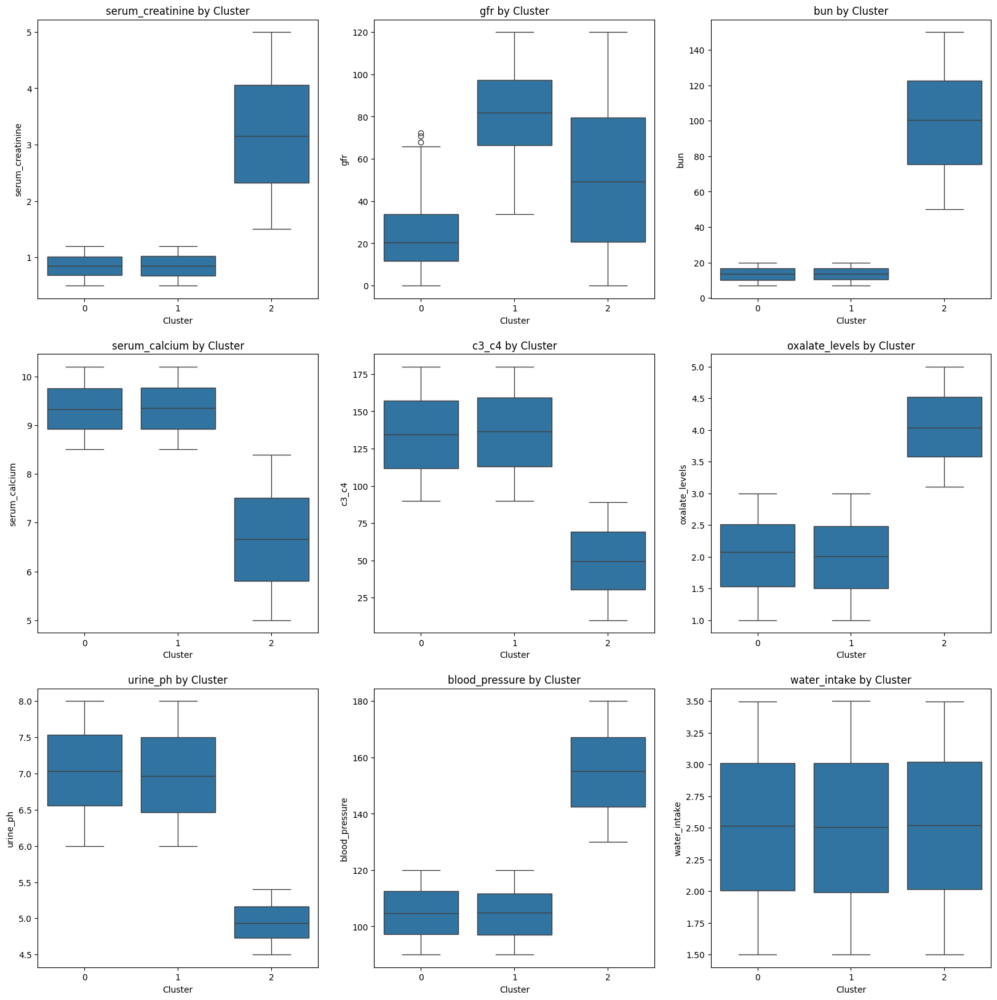

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20,20))
for col, ax in zip(['serum_creatinine', 'gfr', 'bun', 'serum_calcium', 'c3_c4', 'oxalate_levels', 'urine_ph', 'blood_pressure','water_intake'], axes.flatten()):
    sns.boxplot(x = 'predicted_cluster', y = col, data = df_combo_copy, ax=ax)
    ax.set_title('%s by Cluster' %col)
    ax.set_xlabel('Cluster')
    ax.set_ylabel(col)

From the boxplots, it seems that the only numerical feature differentiating between cluster 0 (moderate - severe stages) and cluster 1 (none - moderate stages) is the `Glomerular Filtration Rate (GFR)`. Those with more severe cases tend to have a lower `GFR` median value around 20, whereas people with non-existent to moderate stages would have a median at approximately 80.

Cluster 2 (combination of CKD stages 1-5) is characterized by higher `serum creatinine`, `bun`, `oxalate levels`, and `blood pressure` along with lower values of `serum_calcium`, `c3 c4`, and `urine ph`.

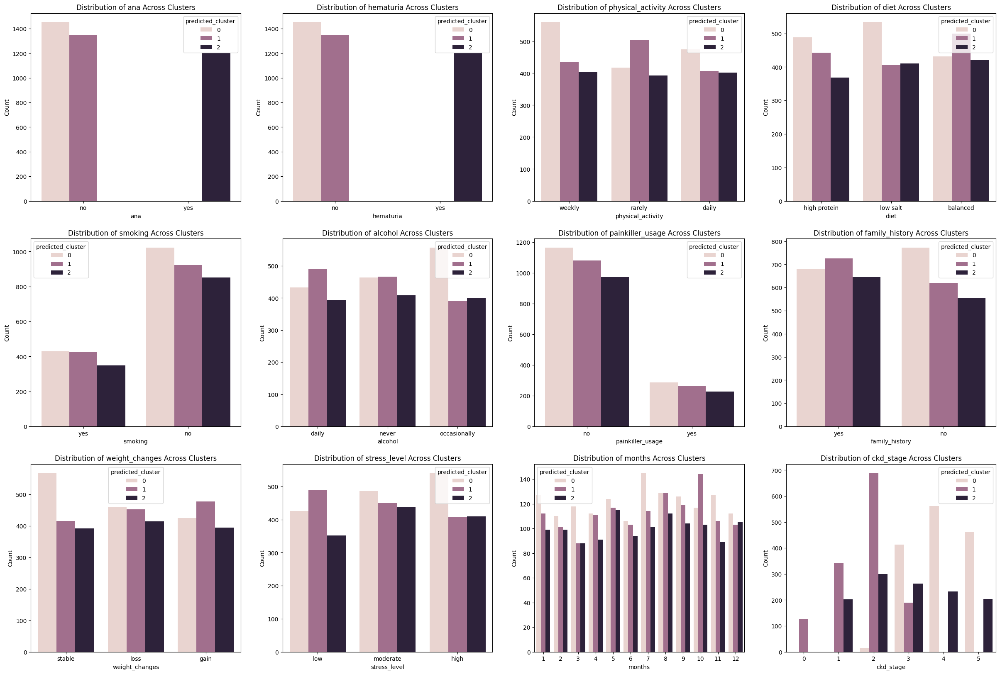

In [80]:
fig, axes = plt.subplots(3, 4, figsize=(30,20))
for col, ax in zip(['ana', 'hematuria', 'physical_activity', 'diet', 'smoking', 'alcohol','painkiller_usage', 'family_history', 'weight_changes', 'stress_level','months', 'ckd_stage'], axes.flatten()):
    sns.countplot(data = df_combo_copy, x = col, hue = 'predicted_cluster', ax = ax)
    ax.set_title('Distribution of %s Across Clusters' %col)
    ax.set_ylabel('Count')

Patients with more severe cases of CKD (cluster 0) tend to have more frequent `physical activity`, low salt `diet`, and occasionally drink more `alcohol` compared to other groups. Additionally, this group appears to have a higher `stress_level` relative to the others.

Patients with none or less severe cases of CKD (cluster 1) tend to have a more balanced `diet`, lower `stress level`, and less frequent `physical activity`.

Patients in cluster 2 tended to have `ana` and `hematuria` while patients in clusters 0 and 1 did not.

### 9.0 Clustering Algorithm 2 - Hierarchical Agglomerative Clustering

#### 9.1 Parameter Selection and Clustering the Data

Based on our team discussion, we selected hierarchical agglomerative clustering with Gower’s distance and complete linkage to handle both continuous lab measures and categorical flags without extensive preprocessing. Complete linkage produces compact, well-separated groups, and the dendrogram shows how clusters merge as you move through different levels. We then used silhouette analysis and an elbow plot on the merge distances to justify cutting the dendrogram into four clusters, balancing cohesion. This aligns with our clinical goal of identifying distinct stages of CKD progression.

In [142]:
dist_mat = gower_matrix(X)
dist_mat

array([[0.        , 0.42679337, 0.31829035, ..., 0.31763372, 0.61599064,
        0.5823893 ],
       [0.42679337, 0.        , 0.5253323 , ..., 0.55014175, 0.38950428,
        0.24848197],
       [0.31829035, 0.5253323 , 0.        , ..., 0.31790537, 0.6432989 ,
        0.4906599 ],
       ...,
       [0.31763372, 0.55014175, 0.31790537, ..., 0.        , 0.3705563 ,
        0.46195573],
       [0.61599064, 0.38950428, 0.6432989 , ..., 0.3705563 , 0.        ,
        0.3220531 ],
       [0.5823893 , 0.24848197, 0.4906599 , ..., 0.46195573, 0.3220531 ,
        0.        ]], dtype=float32)

In [143]:
dm = squareform(dist_mat, force = 'tovector')
dm

array([0.42679337, 0.31829035, 0.6065363 , ..., 0.3705563 , 0.46195573,
       0.3220531 ], dtype=float32)

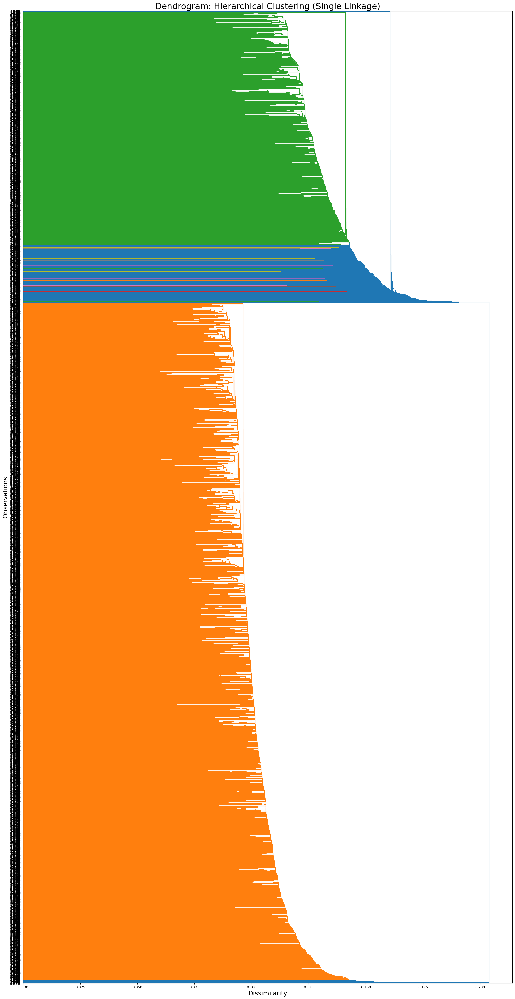

In [88]:
Z = linkage(dm, method='single')

fig, ax = plt.subplots(figsize=(25, 50))
d = dendrogram(Z, orientation='right', ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Observations', fontsize=18)
ax.set_title('Dendrogram: Hierarchical Clustering (Single Linkage)', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

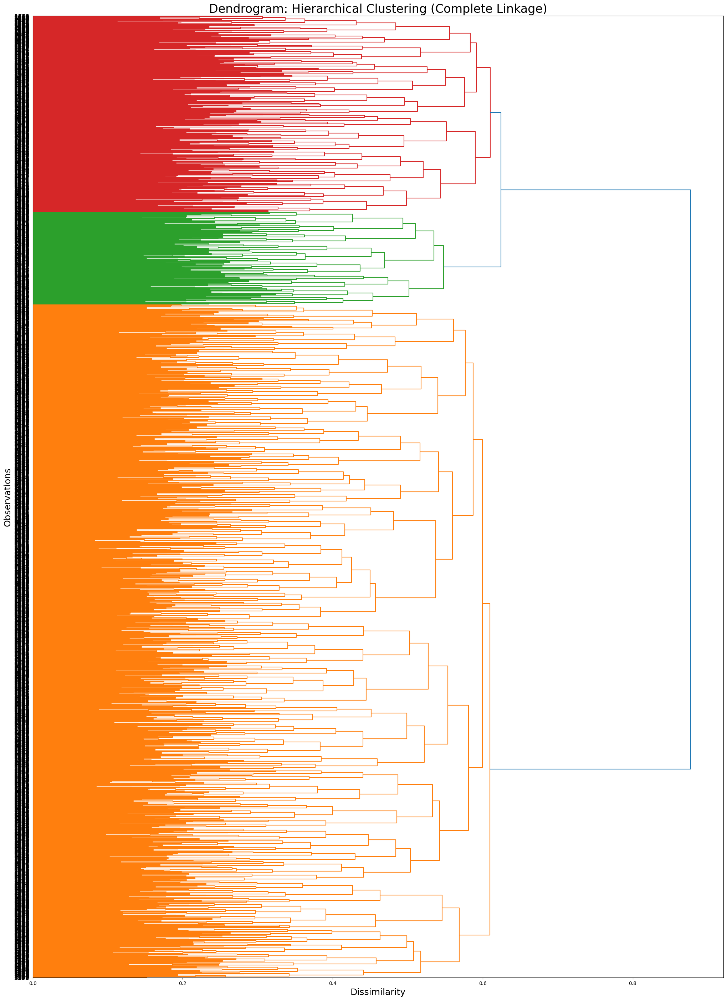

In [144]:
Z = linkage(dm, method='complete')

fig, ax = plt.subplots(figsize=(25, 35))
d = dendrogram(Z, orientation='right', ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Observations', fontsize=18)
ax.set_title('Dendrogram: Hierarchical Clustering (Complete Linkage)', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

Low‐height merges (< 0.2)
- At very small dissimilarities, individual observations with nearly identical lab and flag profiles merge into many small sub-branches. This reflects groups of patients whose Gower distance is minimal.

Intermediate merges (0.2–0.6)
- As we move up the tree, these sub-branches gradually join into larger clusters. The steady accumulation of merges in this range shows that many patients share moderate similarity in their CKD features.

Major jump at ≈ 0.7–0.8
- We see a clear “gap” in merge heights around 0.7–0.8. Cutting the dendrogram at ≈ 0.72 dissimilarity cleanly produces four principal clusters—three merge just below that line, while the final two large clusters only join above 0.8.

Cluster cohesion vs. variability
- One of the clusters (Cluster 1) is especially cohesive, with most of its internal merges occurring below 0.3. The other three clusters show more gradual, higher‐height merges, indicating greater internal heterogeneity.

In summary, the dendrogram supports choosing k = 4: below the 0.72 cut the data naturally divides into four compact, well-separated groups, and forcing any larger k would split very tight sub-clusters, while any smaller k would merge groups that are markedly dissimilar at heights above 0.8.

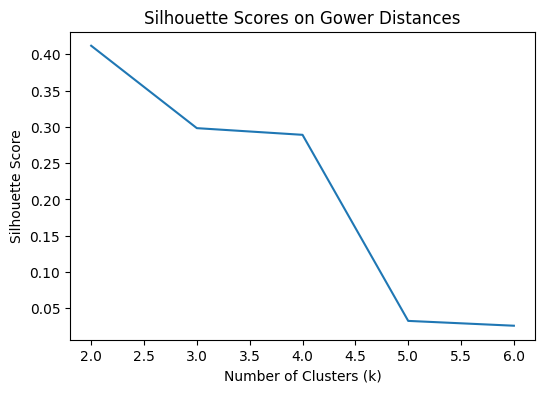

In [145]:
sil_scores = []
Ks = range(2,7)
for k in Ks:
    labels = fcluster(Z, k, criterion='maxclust')
    sil = silhouette_score(dist_mat, labels, metric='precomputed')
    sil_scores.append(sil)

plt.figure(figsize=(6,4))
plt.plot(Ks, sil_scores)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores on Gower Distances')
plt.show()

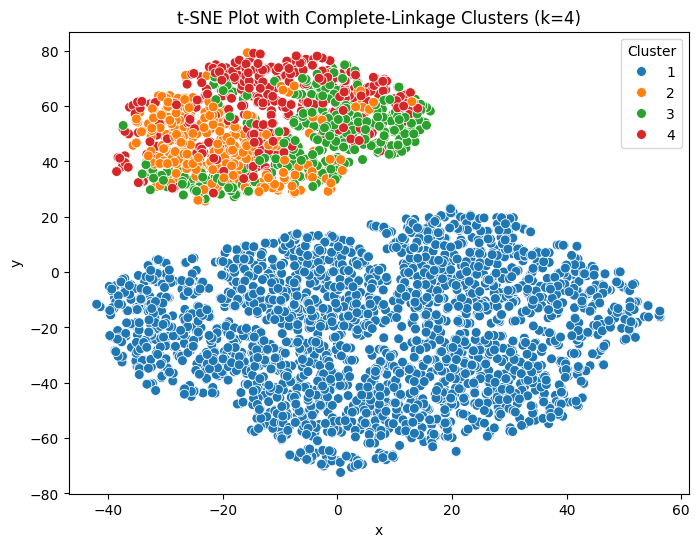

In [146]:
tsne = TSNE(
    n_components=2,
    metric='precomputed',
    perplexity=30,
    init='random',        
    random_state=42
)
proj = tsne.fit_transform(dist_mat)         

df_vis = pd.DataFrame(proj, columns=['x','y'])
df_vis['hier_cluster'] = fcluster(Z, 4, criterion='maxclust')

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='x', y='y', hue='hier_cluster',
    palette='tab10', data=df_vis, s=50
)
plt.title('t-SNE Plot with Complete-Linkage Clusters (k=4)')
plt.legend(title='Cluster')
plt.show()

We chose Gower’s distance to accommodate our mix of numeric and categorical features, and complete linkage to prioritize well-separated clusters. Choosing k via silhouette scores peaked at k = 2 (≈0.41) and dropped sharply beyond k = 4. We settled on k = 4 as a balance between interpretability and cluster cohesion. 

#### 9.2 Additional Cluster Exploration

The similarity matrix shows four diagonal blocks of decreasing darkness: Cluster 0’s block is darkest (highest internal similarity), Cluster 1 is next, Cluster 2 is moderate, and Cluster 3 is lightest (lowest internal similarity). Off‐diagonal regions confirm that Clusters 0 and 1 are most distinct from the others, Cluster 2 is moderately separated, and Cluster 3 lies closest to the remaining clusters.

Silhouette coefficients quantify cluster quality: Cluster 0 has a mean silhouette ≈ 0.70 suggesting very cohesive, well isolated, Cluster 1 ≈ 0.45 suggesting good cohesion, Cluster 2 ≈ 0.30 suggesting moderate cohesion with some border overlap, and Cluster 3 ≈ 0.15 with poor cohesion, high overlap. Clusters 0 and 1 clearly exceed the overall mean silhouette threshold.

Cluster 3’s light similarity block and low silhouette score indicate it is the most sparse and internally heterogeneous. In contrast, Cluster 0’s dark block and high silhouette confirm it is the densest, with Clusters 1 and 2 falling between these extremes.

Silhouette analysis favors large, compact clusters and may understate quality for small or irregular groups. The  similarity matrix can obscure local substructures, and Gower’s uniform feature weighting may misrepresent relevance. Supplementing with per‐cluster density or linkage‐distance inspections would provide a more nuanced assessment.

In [147]:
df_scaled_encoded_hac = df_scaled_encoded.copy()
df_scaled_encoded_hac['x_projected'] = df_vis['x']
df_scaled_encoded_hac['y_projected'] = df_vis['y']
df_scaled_encoded_hac['predicted_cluster'] = df_vis['hier_cluster'] - 1
df_scaled_encoded_hac.head()

,serum_creatinine,gfr,bun,serum_calcium,c3_c4,oxalate_levels,urine_ph,blood_pressure,water_intake,ana,hematuria,physical_activity,diet,smoking,alcohol,painkiller_usage,family_history,weight_changes,stress_level,months,ckd_stage,x_projected,y_projected,predicted_cluster
0,-0.712825,-0.546420,-0.748235,1.070476,0.611108,0.233071,1.369625,-0.179368,-0.327237,0.0,0.0,2.0,1.0,1.0,0.0,0.0,1.0,2.0,1.0,9.0,3.0,22.444498,-51.706310,0
1,1.854574,-0.554032,2.400610,-0.147484,-1.836193,1.968734,-1.374106,0.412320,-0.437784,1.0,1.0,2.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,3.0,-31.471954,57.152180,1
2,-0.334829,-1.444107,-0.549943,0.628234,1.164609,-0.740227,-0.192389,-0.861414,0.063476,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,2.0,2.0,3.0,5.0,30.525646,1.695588,0
3,2.672443,1.690735,0.328579,-0.698917,-0.831377,1.311063,-1.039941,0.889120,0.232691,1.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,2.0,0.0,8.0,1.0,-9.254855,42.967293,3
4,2.767387,-0.276890,2.231973,-0.889342,-1.855477,0.566297,-1.427310,1.277608,1.105849,1.0,1.0,2.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,6.0,3.0,7.062855,43.302109,2


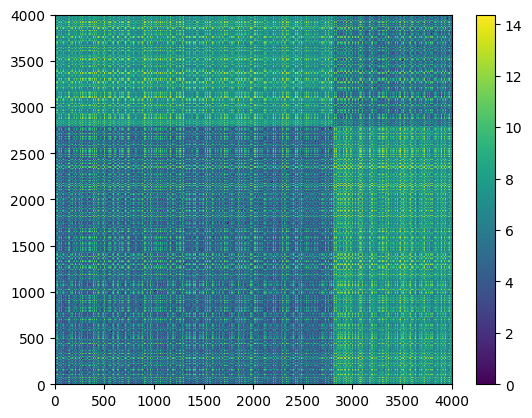

In [148]:
# Cluster sorted similarity matrix
df_sort=df_scaled_encoded_hac.sort_values(by=['predicted_cluster'])
df_sort=df_sort.drop(['x_projected', 'y_projected', 'predicted_cluster', 'ckd_stage'], axis=1)

dist_mat = squareform(pdist(df_sort))
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

For n_clusters = 4 The average silhouette_score is : 0.30837055747310776


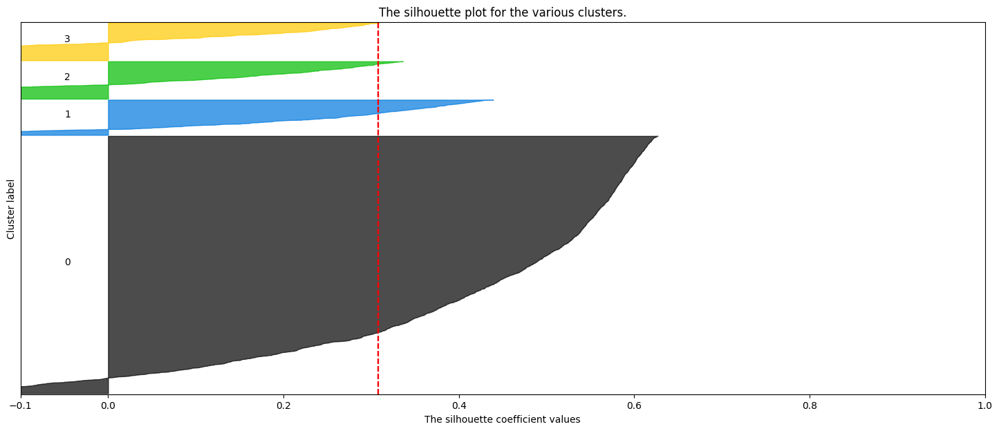

In [128]:
show_silhouette_plots(df_scaled_encoded_hac, df_scaled_encoded_hac['predicted_cluster'])

#### 9.3 Descriptive analysis of each cluster

In [95]:
df_char = df.copy()
df_char['hier_cluster'] = df_vis['hier_cluster']

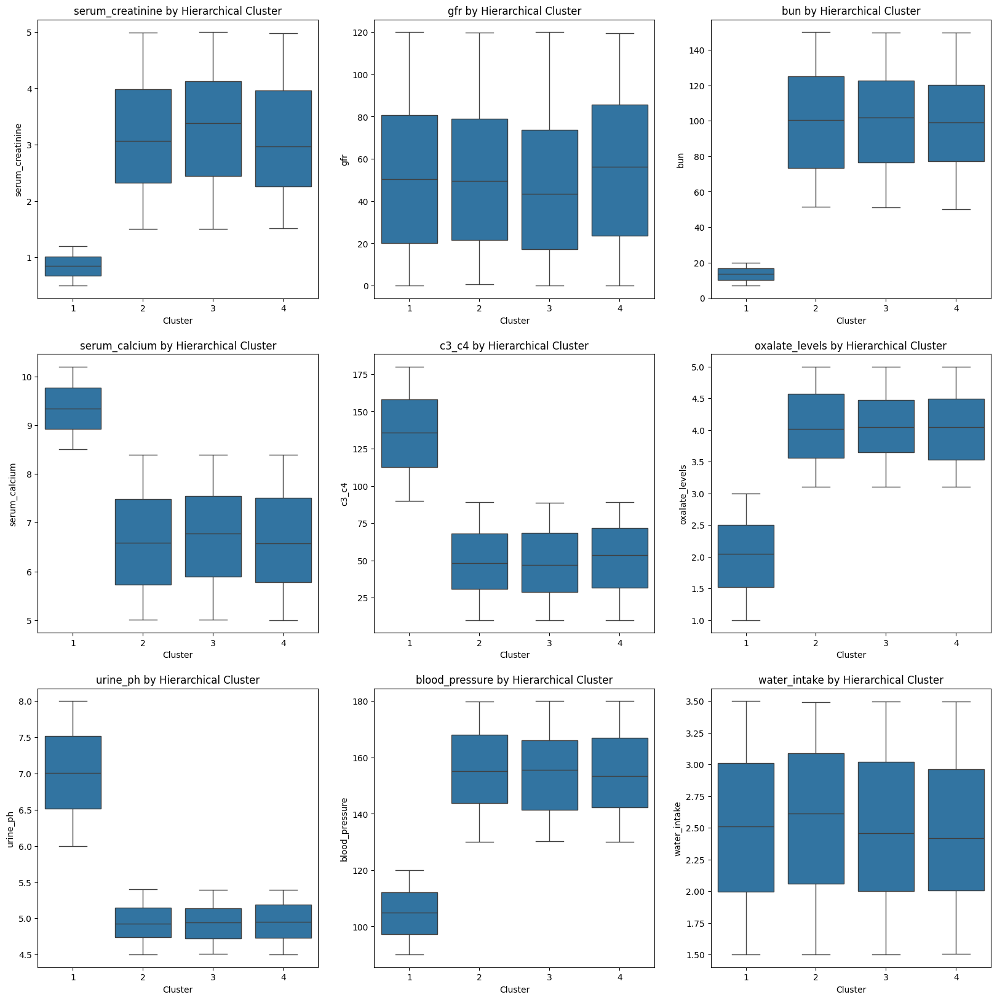

In [98]:
fig, axes = plt.subplots(3, 3, figsize=(20,20))
for col, ax in zip(['serum_creatinine', 'gfr', 'bun', 'serum_calcium', 'c3_c4','oxalate_levels', 'urine_ph', 'blood_pressure', 'water_intake'], axes.flatten()):
    sns.boxplot(
        x='hier_cluster',
        y=col,
        data=df_char,
        ax=ax
    )
    ax.set_xlabel('Cluster')
    ax.set_ylabel(col)
    ax.set_title(col + ' by Hierarchical Cluster')

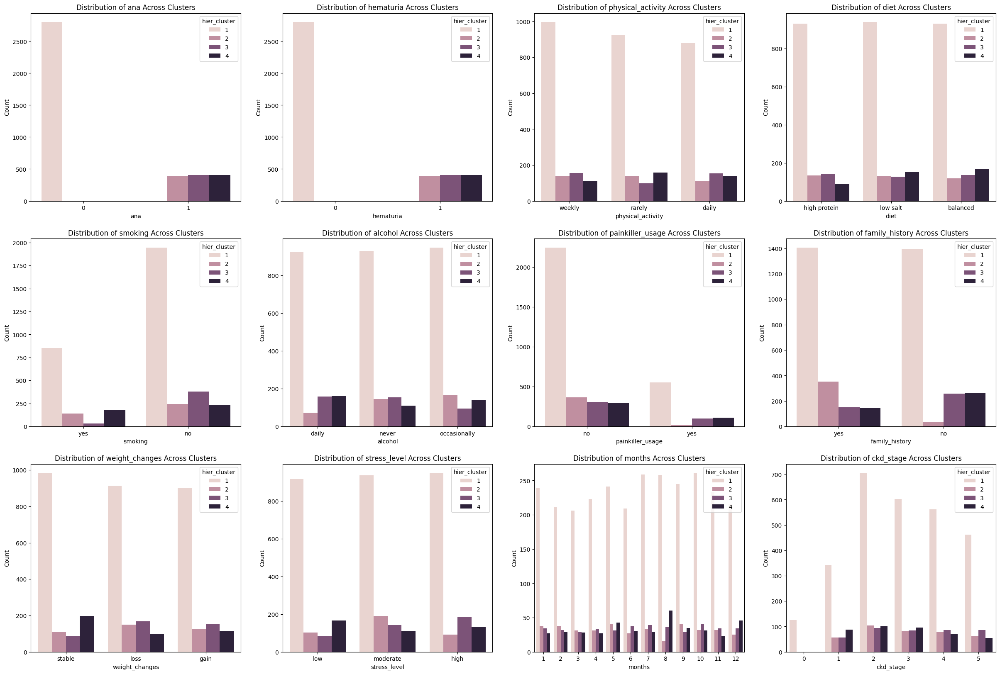

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(30,20))
for col, ax in zip(['ana', 'hematuria', 'physical_activity', 'diet', 'smoking', 'alcohol','painkiller_usage', 'family_history', 'weight_changes', 'stress_level','months', 'ckd_stage'], axes.flatten()):
    sns.countplot(data = df_char, x = col, hue = 'hier_cluster', ax = ax)
    ax.set_title('Distribution of %s Across Clusters' %col)
    ax.set_ylabel('Count')

Cluster Profiles:
- Cluster 1 (blue) shows uniformly low `serum_creatinine`, `oxalate_levels`, `blood_pressure`, and `BUN`, suggesting healthier profiles. This cluster also exhibits healthier levels of `serum_calcium`, `urine_ph`, and `c3_c4`.
- Clusters 2–4 exhibit similar values of our biochemical variables.
- Clusters 1, and 3 showed lower rates of `smoking`
- Cluster 2 showed notably lower rates of `painkiller usage`.
- Cluster 2 had higher rates of `family history` for CKD while clusters 3 and 4 had lower rates of `family history`.

### 10.0 Discussion

#### 10.1 Clustering Differences
To assess the differences between our k-prototypes clustering and HAC complete linkage clustering, we calculated the adjusted rand score:

In [104]:
rand_score = adjusted_rand_score(df_combo['predicted_cluster'], df_char['hier_cluster'])
rand_score

0.39849084337056007

The adjusted rand score of 0.3985 indicates that the clusters produced by our two clustering algorithms agree in their cluster assignments for approximately 39.85% of the observations in the dataset. To learn more about the differences between the two clusterings, we color-coded the same t-SNE plot by each algorithm's cluster labels.

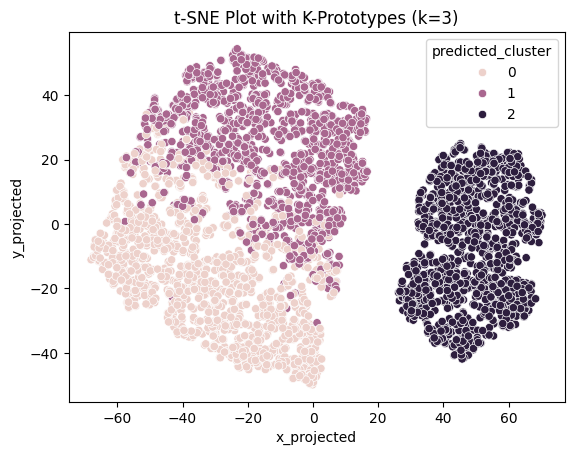

In [115]:
tsne = TSNE(n_components=2, perplexity=30, random_state=111)
data_tsne = tsne.fit_transform(X_num)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)

kp_final = KPrototypes(n_clusters = 3, random_state = 100, gamma = .5)
pred_cluster = kp_final.fit_predict(X, categorical = [4, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20])

df_combo['predicted_cluster'] = pred_cluster

sns.scatterplot(x='x_projected', y='y_projected', hue='predicted_cluster', data=df_combo)
plt.title('t-SNE Plot with K-Prototypes (k=3)')
plt.show()

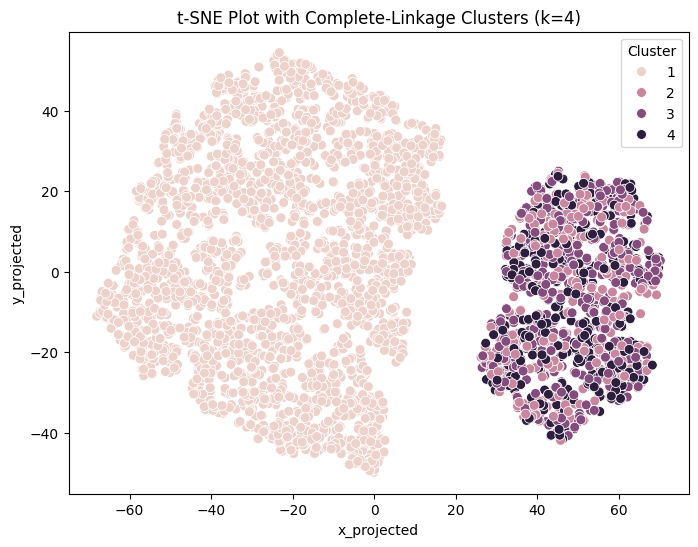

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=111)
data_tsne = tsne.fit_transform(X_num)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_vis = pd.concat([df, df_tsne], axis=1)

df_vis['hier_cluster'] = fcluster(Z, 4, criterion='maxclust')

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='x_projected', y='y_projected', hue='hier_cluster',
    data=df_vis, s=50
)
plt.title('t-SNE Plot with Complete-Linkage Clusters (k=4)')
plt.legend(title='Cluster')
plt.show()

Based on these t-SNE plots, both clustering algorithms created one cluster from one of the two well-separated clusters present in the dataset (the smaller cluster in the k-prototypes plot and the larger cluster in the HAC plot). K-prototypes had a clearer distinction between the two remaining clusters while HAC with complete linkage seems to lack any structure in its remaining three clusters. 

#### 10.2 Inherent Clustering Structure
Overall, k-prototypes appears to perform better at identifying the inherent clustering structure shown by the t-SNE plots. It identified the two main well-separated clusters as well as two potential subclusters within the large cluster that were less well-separated. HAC  with complete linkage successfully identified the main clusters but did not perform as well when identifying potential subclusters in the dataset, as shown by the color-coded cluster labels for clusters 2, 3, and 4.

Based on these insights, we might be more inclined to trust the k-prototypes clustering algorithm more when identifying the inherent clustering structure of our dataset. Each of the clusters found using k-prototypes were relatively clearly aligned with one of the inherent clusters or subclusters, while three of the four clusters found with complete linkage were not easily distinguishable from one another and did not help to identify any of the inherent subclusters. 

#### 10.3 Clustering Insights

Our k-prototypes clustering algorithm reveals more information about the characteristics of patients with less severe and more severe cases of CKD. While our HAC algorithm had observations with all levels of CKD severity in all clusters, our k-prototypes clusters 0 and 1 were comprised of more severe cases (stages 2-5) and less severe cases (stages 0-3) respectively. Because of this distinction, we were able to extract more meaningful insights about the relationship between CKD severity and the various features in our dataset such as diet, exercise, and stress levels. These insights are most closely aligned with our research goals and can help inform doctors on the characteristics to look for in patients that might be indications of kidney disease.

Although the HAC with complete linkage algorithm may not be able to provide as much insight into the characteristics of patients in various stages of CKD, it might still reveal information about the relationship between `ana` (an autoimmune marker) and `hematuria` (presence of blood in urine) with the other variables. The bar plots in our descriptive analysis for complete linkage shows that patients without `ana` and `hematuria` were exclusively clustered into cluster 1 while patients with `ana` and `hematuria` were clustered into clusters 2, 3, and 4. This means that characteristics of cluster 1 such as low rates of `painkiller usage` and `smoking` may be significant areas for researchers and doctors to explore to promote autoimmune diseases and hematuria prevention efforts.

### 11.0 Conclusion


In our analysis of the Chronic Kidney Disease (CKD) dataset, we explored two methods of clustering the data with the goal of identifying characteristics that distinguish CKD and non-CKD patients. Through the k-prototypes clustering algorithm, we learned that patients with more severe CKD tended to exhibit more frequent `physical activity`, a low salt `diet`, higher `stress level`, and more occassional `alcohol` consumption, while patients with no CKD or less severe CKD tend to have a more balanced `diet`, lower `stress level`, and less frequent `physical activity`. Through hierarchical clustering with complete linkage, we learned that there may be a positive relationship between the presence of autoimmune diseases/hematuria and other features such as `painkiller usage` and `smoking`.

These insights may be beneficial for researchers to use when researching the symptoms and causes of chronic kidney disease, autoimmune diseases, or hematuria. Nephrologists may find our analysis of the characteristics seen in patients with severe CKD to be helpful in early prevention treatment for patients. Public health officials might also benefit from this analysis as the clustering characteristics can provide information about how to successfully navigate prevention efforts for CKD, autoimmune diseases, and hematuria. 

Though we were able to identify clear distinguishing factors between CKD and non-CKD patients, our analysis could be improved by including demographic data. This is important for researchers, doctors, and officials to keep in mind when using our analysis--demographics such as age, gender, and ethnicity might have a significant effect on a patient being at risk for kidney disease, and overlooking this key factor could potentially negatively impact diagnoses for underrepresented minorities. 

In the future, we might want to expand our analysis by exploring different clustering algorithms, dimensionality reduction techniques, and more of the relationship between the `ana` (presence of autoimmune disease), `hematuria`, and `ckd_stages` variables.

### 12.0 References
Islam, Md Ariful, et al. “Chronic Kidney Disease Prediction Based on Machine Learning Algorithms.” Journal of Pathology Informatics, U.S. National Library of Medicine, 12 Jan. 2023, pmc.ncbi.nlm.nih.gov/articles/PMC9874070/. 

CDC. “Chronic Kidney Disease Basics.” Chronic Kidney Disease, 26 Mar. 2024, www.cdc.gov/kidney-disease/about/index.html.

‌Qin, Yi, et al. “Use of Consensus Clustering to Identify Distinct Subtypes of Chronic Kidney Disease and Associated Mortality Risk.” Scientific Reports, vol. 14, no. 1, 2 Dec. 2024, https://doi.org/10.1038/s41598-024-81208-1. Accessed 12 Apr. 2025.